## Imports

In [1]:
import pandas as pd

import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from wordcloud import WordCloud
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

import string
import re
import random
import datetime
from IPython import display as disp

import torch
from torch.utils.data import DataLoader, Dataset
import torch.nn.functional as F
import torch.nn as nn
from tqdm import tqdm


from transformers import BertTokenizer, BertModel
from transformers import pipeline

from guidance import models, gen, select


from sklearn import metrics


## 1) Analytics

### &emsp; &emsp; a) Text Pre-processing and N-Gram Analysis

In [2]:
# Download the dataset
!git clone https://github.com/FakeNewsChallenge/fnc-1.git

fatal: destination path 'fnc-1' already exists and is not an empty directory.


In [3]:
# Load the training and (annotated) test data
train_bodies_df = pd.read_csv("fnc-1/train_bodies.csv")
train_stances_df = pd.read_csv("fnc-1/train_stances.csv")

test_bodies_df = pd.read_csv("fnc-1/competition_test_bodies.csv")
test_stances_df = pd.read_csv("fnc-1/competition_test_stances.csv")

In [4]:
# The following section removes less useful/meaningful strings for the tasks ahead
# Regex for removing URLs
def remove_URL(text):
    url = re.compile(r'https?://\S+|www\.\S+')
    return url.sub('', text)

train_bodies_df["articleBody"] = train_bodies_df["articleBody"].apply(lambda x: remove_URL(x))
train_stances_df["Headline"] = train_stances_df["Headline"].apply(lambda x: remove_URL(x))
test_bodies_df["articleBody"] = test_bodies_df["articleBody"].apply(lambda x: remove_URL(x))
test_stances_df["Headline"] = test_stances_df["Headline"].apply(lambda x: remove_URL(x))

In [5]:
# Regex for removing HTML tags, ampersands etc...
# Source: https://stackoverflow.com/questions/9662346/python-code-to-remove-html-tags-from-a-string
def remove_html(text):
    html = re.compile('<.*?>|&([a-z0-9]+|#[0-9]{1,6}|#x[0-9a-f]{1,6});')
    return html.sub('', text)

train_bodies_df["articleBody"] = train_bodies_df["articleBody"].apply(lambda x: remove_html(x))
train_stances_df["Headline"] = train_stances_df["Headline"].apply(lambda x: remove_html(x))
test_bodies_df["articleBody"] = test_bodies_df["articleBody"].apply(lambda x: remove_html(x))
test_stances_df["Headline"] = test_stances_df["Headline"].apply(lambda x: remove_html(x))

In [6]:
# Regex for removing some emojis/symbols
def remove_emoji(text):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  
                           u"\U0001F300-\U0001F5FF"  
                           u"\U0001F680-\U0001F6FF"  
                           u"\U0001F1E0-\U0001F1FF"  
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

train_bodies_df["articleBody"] = train_bodies_df["articleBody"].apply(lambda x: remove_emoji(x))
train_stances_df["Headline"] = train_stances_df["Headline"].apply(lambda x: remove_emoji(x))
test_bodies_df["articleBody"] = test_bodies_df["articleBody"].apply(lambda x: remove_emoji(x))
test_stances_df["Headline"] = test_stances_df["Headline"].apply(lambda x: remove_emoji(x))

In [7]:
# Removing punctuation (useful for topic modelling/n-gram analysis)
def remove_punct(text):
    table = str.maketrans('', '', string.punctuation)
    return text.translate(table)


train_bodies_df["articleBody"] = train_bodies_df["articleBody"].apply(lambda x: remove_punct(x))
train_stances_df["Headline"] = train_stances_df["Headline"].apply(lambda x: remove_punct(x))
test_bodies_df["articleBody"] = test_bodies_df["articleBody"].apply(lambda x: remove_punct(x))
test_stances_df["Headline"] = test_stances_df["Headline"].apply(lambda x: remove_punct(x))

In [8]:
# This function removes extra characters (#, \n, \r) as well as lemmatizing
# NOTE: lemmatizing was not used in the end since it allowed for a clearer, more intuitive 
#       analysis of n-grams and topics (e.g. names like james aren't reduced to jam)
def lemmatize_text(text, lemmatize):
    wnl = WordNetLemmatizer()
    text_sep = text.split(" ")
    outp_text = list()
    for word in text_sep:
        word = (
            word
            .replace("#", "")
            .replace("\n", "")
            .replace("\r", "")
        )
        if lemmatize:
            new_word = wnl.lemmatize(word.lower(), wordnet.VERB)
        else:
            new_word = word.lower()
        outp_text.append(new_word)
    outp = ' '.join(outp_text)
    outp = outp.strip()
    return outp

train_bodies_df["articleBody"] = train_bodies_df["articleBody"].apply(lambda x: lemmatize_text(x, False))
train_stances_df["Headline"] = train_stances_df["Headline"].apply(lambda x: lemmatize_text(x, False))
test_bodies_df["articleBody"] = test_bodies_df["articleBody"].apply(lambda x: lemmatize_text(x, False))
test_stances_df["Headline"] = test_stances_df["Headline"].apply(lambda x: lemmatize_text(x, False))


In [9]:
# Prepare stopwords
stop = set(stopwords.words("english"))

In [10]:
# This function merges the headline and article dataframes according to the foreign key
def combine_df(stances, bodies, labels=False):
    
    # Combine Datasets
    df_combined = stances.merge(bodies, left_on="Body ID", right_on="Body ID")

    # Relabel dataframe between related and unrelated
    if labels:
        df_combined["Stance"] = df_combined["Stance"].map({
            "unrelated": labels[1],
            "agree": labels[0],
            "disagree": labels[0],
            "discuss": labels[0]
        })
    return df_combined

# Removes stopwords from a given dataframe's column
def remove_stopwords(df, colIdx, stopw):
    words = []
    for i in range(len(df)):
        for word in df.iloc[i, colIdx].split():
            if word not in stopw:
                words.append(word)
    return words


# Outputs the n-gram analysis results as a dataframe
def n_gram_analysis(stances, bodies, stopw, n, k, labels):

    # Combine the dfs
    df_combined = combine_df(stances, bodies, labels)
    
    # Extract the words from each category
    corpus = {}
    for label in labels:
        df_filt = df_combined.loc[df_combined["Stance"] == label]
        corpus[label + "_" + "Headline"] = remove_stopwords(df_filt, 0, stopw)
        corpus[label + "_" + "Body"] = remove_stopwords(df_filt, 3, stopw)

    # Build the n-gram data
    ngram_data = {
        "n-gram": [],
        "count": [],
        "rank": [],
        "Category": []
    }
    for key in corpus.keys():
        extract = pd.Series(nltk.ngrams(corpus[key], n)).value_counts()[:k]
        ngram_data["n-gram"].extend(list(extract.index))
        ngram_data["count"].extend(list(extract.values))
        ngram_data["rank"].extend(list(range(k + 1)[1:]))
        ngram_data["Category"].extend([key.replace("_", " ")] * k)
    
    # Output the resulting df
    res = pd.DataFrame(ngram_data)
    res["rank_category"] = res["rank"].astype(str) + "_" + res["Category"]
    return res

# Generates the n gram data   
labels = ["Related", "Unrelated"]     # distinguish between the related (discuss, agree, disagree) and unrelated classes
n = 4                                 # the context window length n
k = 8                                 # the top k most frequent n-grams to keep for the analysis
n_gram_df = n_gram_analysis(train_stances_df, train_bodies_df, stop, n, k, labels)
#n_gram_df = n_gram_analysis(test_stances_df, test_bodies_df, stop, n, k, labels)

In [11]:
n_gram_df

,n-gram,count,rank,Category,rank_category
0,"(journalist, james, wright, foley)",321,1,Related Headline,1_Related Headline
1,"(american, journalist, james, wright)",186,2,Related Headline,2_Related Headline
2,"(audio, michael, brown, shooting)",135,3,Related Headline,3_Related Headline
3,"(alleged, audio, michael, brown)",125,4,Related Headline,4_Related Headline
4,"(us, journalist, james, foley)",107,5,Related Headline,5_Related Headline
5,"(photojournalist, james, wright, foley)",92,6,Related Headline,6_Related Headline
6,"(recording, michael, brown, shooting)",90,7,Related Headline,7_Related Headline
7,"(bale, play, steve, jobs)",83,8,Related Headline,8_Related Headline
8,"(islamic, state, iraq, syria)",380,1,Related Body,1_Related Body
9,"(american, journalist, james, foley)",367,2,Related Body,2_Related Body


C:\Users\alecz\AppData\Local\Temp\ipykernel_16028\3690805381.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(n_gram_df["n-gram"], fontsize=8)


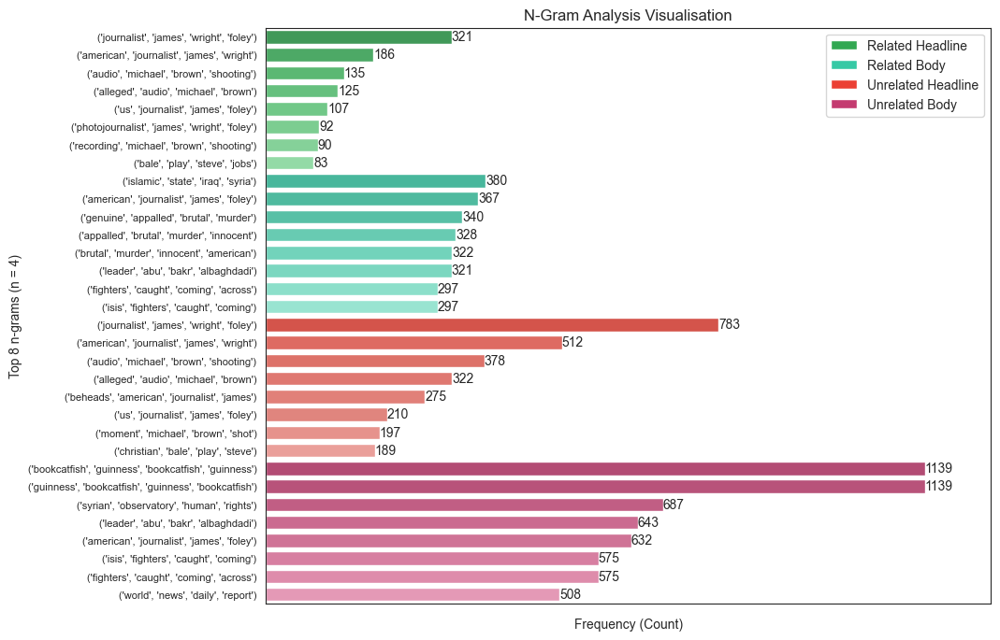

In [12]:
# Visualise the n-gram analysis
plt.figure(figsize=(10, 8))
sns.set_style("white")

colours = [
    "#32a852", "#3eb85f", "#4cc76c", "#57cf77", "#63d681", "#6edb8b", "#78de93", "#87e6a0",
    "#36c9a5", "#3dcca8", "#47d1af", "#58dbba", "#62e3c3", "#6ce6c7", "#7eedd1", "#8df0d7",
    "#eb4034", "#f2594e", "#f06156", "#f2685e", "#f27168", "#f0776e", "#f5857d", "#f7948d",
    "#c43b70", "#c94276", "#d14d80", "#db5a8c", "#de6493", "#e6709d", "#eb7fa8", "#f08db3",
]

ax = sns.barplot(n_gram_df, x="count", y="rank_category", hue="rank_category", legend=False, orient="h", 
                 width=0.75, palette=colours)
for i in range(len(n_gram_df)):
    ax.bar_label(ax.containers[i], fontsize=10)
ax.set_yticklabels(n_gram_df["n-gram"], fontsize=8)
plt.xticks([0, max(n_gram_df["count"]*1.1)])
ax.set_xticklabels([])

legend_elem = [
    Patch(facecolor="#32a852", label="Related Headline"),
    Patch(facecolor="#36c9a5", label="Related Body"),
    Patch(facecolor="#eb4034", label="Unrelated Headline"),
    Patch(facecolor="#c43b70", label="Unrelated Body")
]
ax.legend(handles=legend_elem, loc="upper right")

plt.xlabel("Frequency (Count)")
plt.ylabel(f"Top {k} n-grams (n = {n})")
plt.title("N-Gram Analysis Visualisation")
plt.show()

### &emsp; &emsp; b) LDA Analysis

In [24]:
# Rebuild the combined related/unrelated training sets
train_comb = combine_df(train_bodies_df, train_stances_df, labels)
train_related = train_comb.loc[train_comb["Stance"] == "Related"]
train_unrelated = train_comb.loc[train_comb["Stance"] == "Unrelated"]

In [25]:
train_related.head()

,Body ID,articleBody,Headline,Stance
24,0,a small meteorite crashed into a wooded area i...,small meteorite strikes in nicaraguas capital ...,Related
36,4,last week we hinted at what was to come as ebo...,it begins hazmatwearing passenger spotted at a...,Related
69,5,newser – wonder how long a quarter pounder wit...,20yearold quarter pounder looks about the same,Related
88,5,newser – wonder how long a quarter pounder wit...,two blokes dared to eat 20yearold burger for c...,Related
93,6,posting photos of a guntoting child online isi...,‘the cub of baghdadi isis reports its youngest...,Related


In [15]:
# Preparation for the LDA analysis
# This function creates the list of documents (articleBody), where each entry is itself a
#   list of words (stopwords removed)
# Source: https://towardsdatascience.com/end-to-end-topic-modeling-in-python-latent-dirichlet-allocation-lda-35ce4ed6b3e0
def prepare_lda(df, sw):
    data = list(df["articleBody"].values)

    gen_data = []
    for article in data:
        gen_data.append(gensim.utils.simple_preprocess(str(article), deacc=True))

    out = [[word for word in simple_preprocess(str(article)) if word not in sw]
            for article in gen_data]
    return out

word_data_dict = {}

word_data_dict["Related"] = prepare_lda(train_related, stop) 
word_data_dict["Unrelated"] = prepare_lda(train_unrelated, stop)

In [16]:
# Maps each word in each article to a specific index, and counts the frequency with which it occurs
maps = {
    "Related": corpora.Dictionary(word_data_dict["Related"]),
    "Unrelated": corpora.Dictionary(word_data_dict["Unrelated"])
}

print(len(maps["Related"]))
print(len(maps["Unrelated"]))

# Filter the extreme cases to make LDA quicker to run
# Additionally, words that appear in over 50% of documents are excluded (less distinguishing)
# Words that appear less than 20 times may be uniquely identifying, but removing them reduces
#   the sparsity and assists in performance (given limited computational resources)
maps["Related"].filter_extremes(no_below=20, no_above=0.5)
maps["Unrelated"].filter_extremes(no_below=20, no_above=0.5)

print(len(maps["Related"]))
print(len(maps["Unrelated"]))

#maps["Related"].token2id

34466
26350
11578
20878


In [17]:
# Creates the bag of words models for each article using the mapping earlier
# List of (token id, freq)
corpus_bow = {
    "Related": [maps["Related"].doc2bow(article) for article in word_data_dict["Related"]],
    "Unrelated": [maps["Unrelated"].doc2bow(article) for article in word_data_dict["Unrelated"]]
}

In [18]:
# The number of topics found to identify numerous meaningful and distinguishable topics was 20,
#   since using much lower values would result in more ambiguous topics (combining differing ideas
#   into one). However, the training duration increases as a result.
numTopics = 20 

In [19]:
# Training this can take a while
#related_lda = gensim.models.LdaMulticore(corpus=corpus_bow["Related"], id2word=maps["Related"], num_topics=numTopics, workers=8, chunksize=100, passes=500)
#related_lda.save("./lda_saved/related_lda.model")
related_lda = gensim.models.LdaMulticore.load("./lda_saved/related_lda.model")

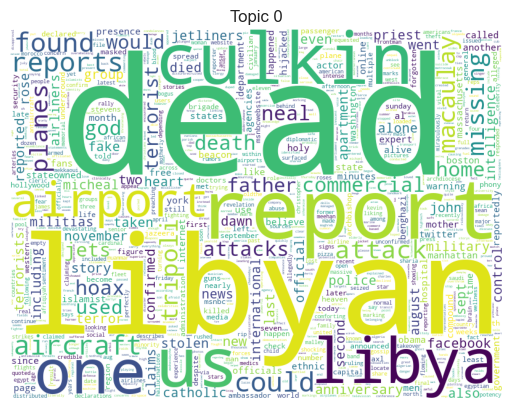

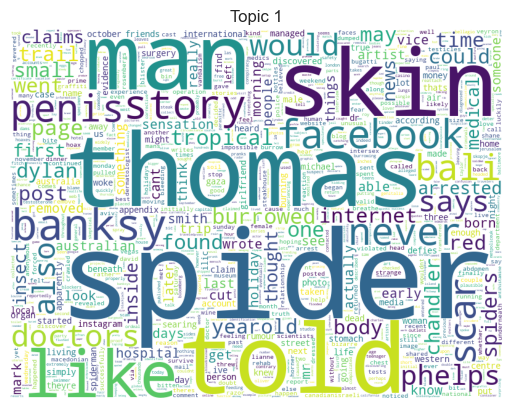

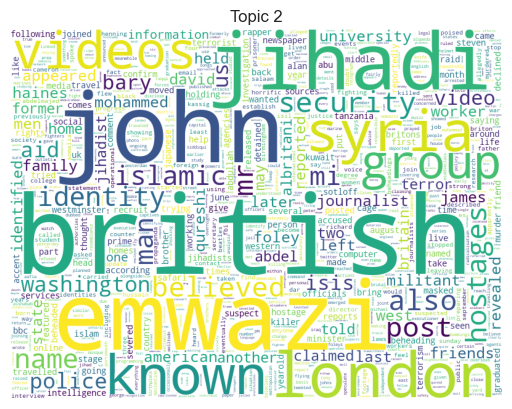

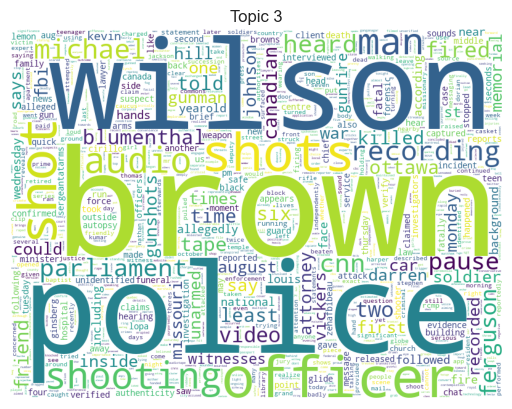

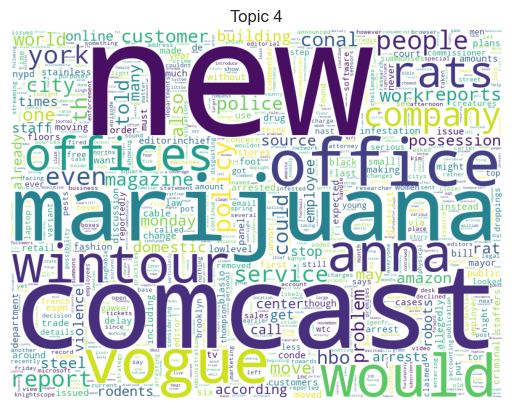

...

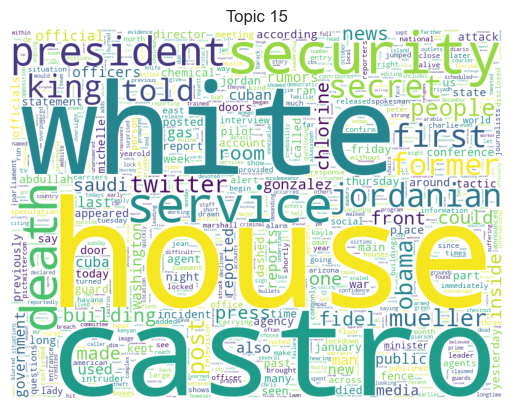

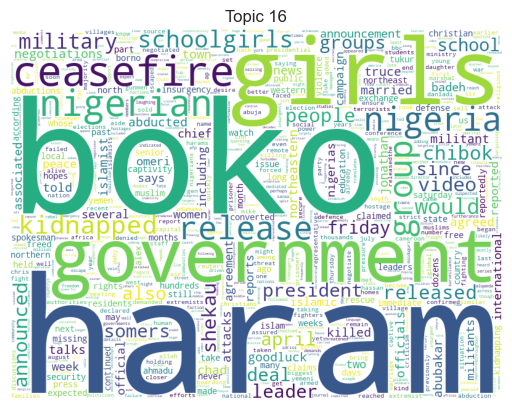

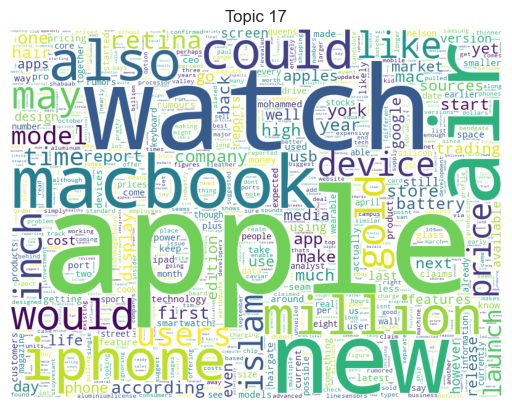

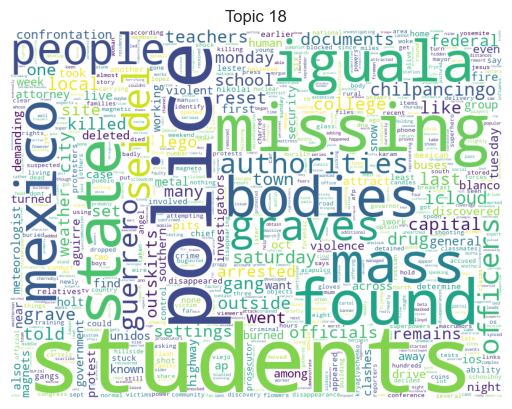

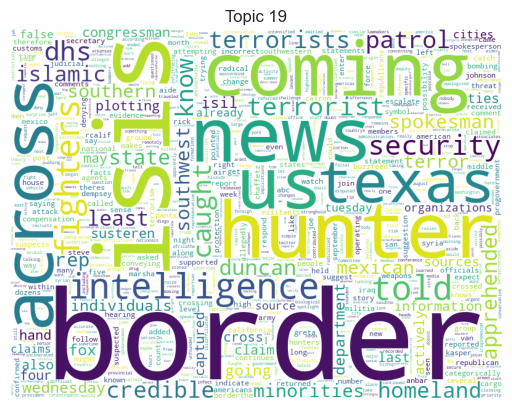

In [20]:
# Visualise the topics as word clouds (for the Related category)
for topic in range(related_lda.num_topics):
    plt.figure()
    plt.imshow(WordCloud(
        width=800, height=600, background_color="white", max_words=1000, 
        contour_width=3, colormap="viridis"
    ).fit_words(dict(related_lda.show_topic(topic, 1000))))
    plt.title(f"Topic {topic}")
    plt.axis("off")
    plt.show()

In [21]:
# Training this can take a while
#unrelated_lda = gensim.models.LdaMulticore(corpus=corpus_bow["Unrelated"], id2word=maps["Unrelated"], num_topics=numTopics, workers=8, chunksize=100, passes=500)
#unrelated_lda.save("./lda_saved/unrelated_lda.model")
unrelated_lda = gensim.models.LdaMulticore.load("./lda_saved/unrelated_lda.model")

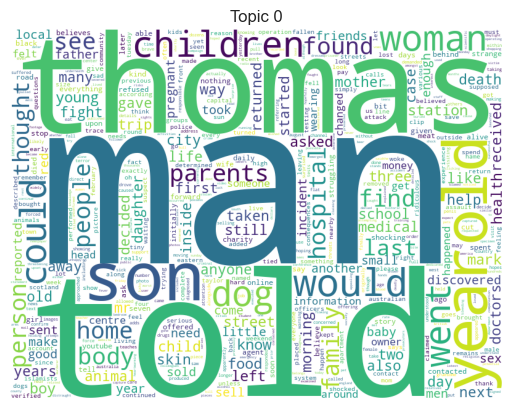

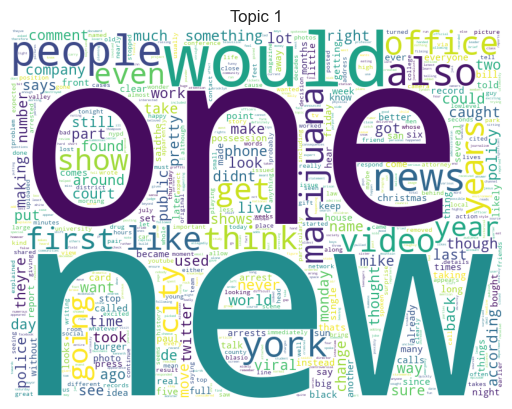

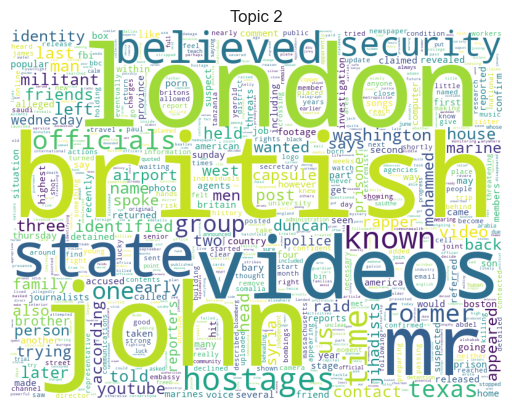

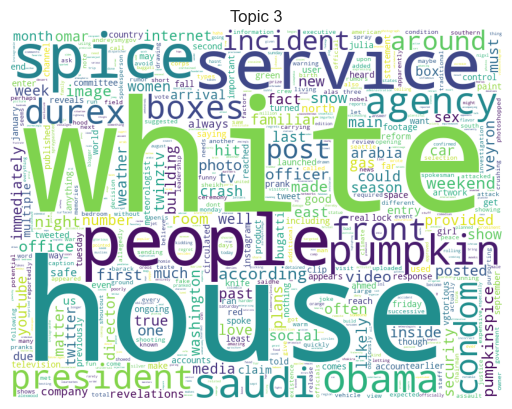

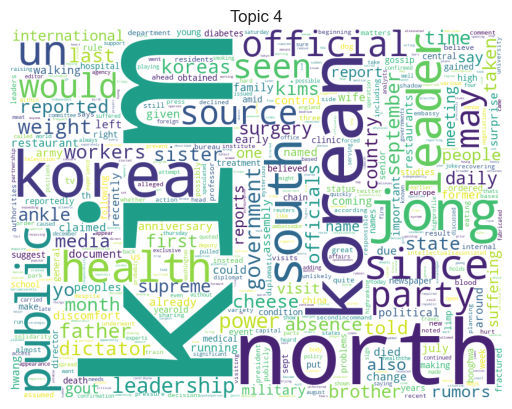

...

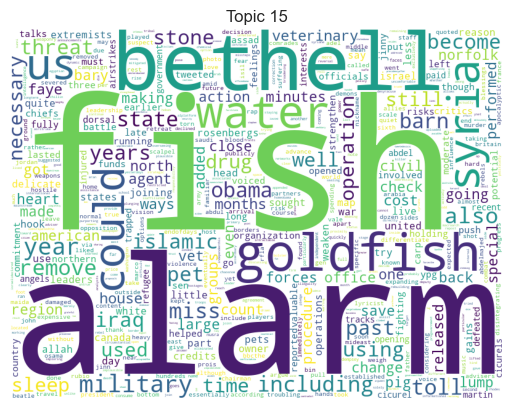

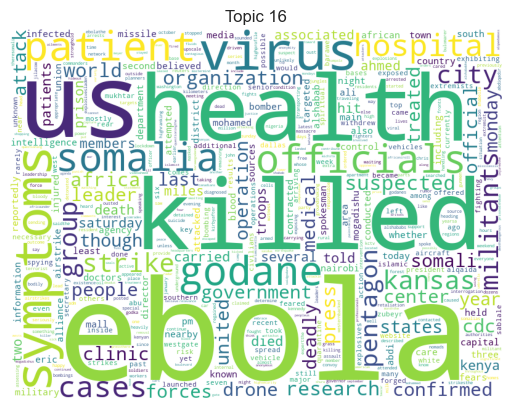

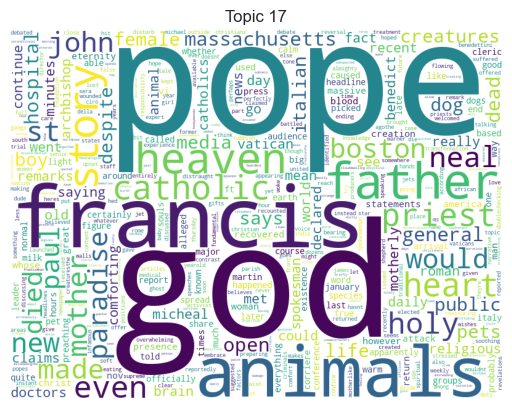

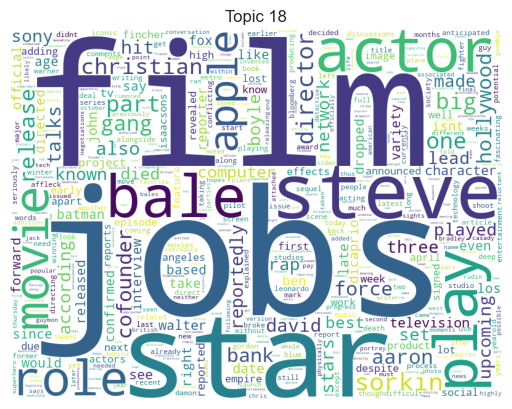

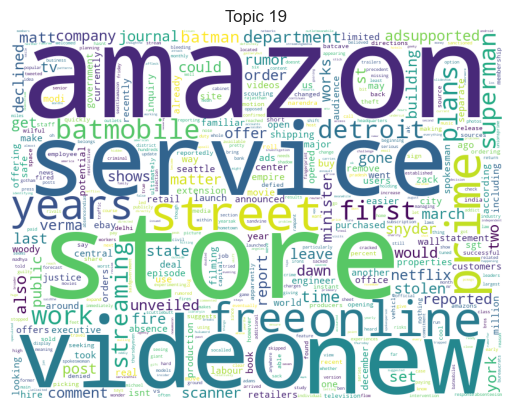

In [22]:
# Visualise the topics as word clouds (for the Unrelated category)
for topic in range(unrelated_lda.num_topics):
    plt.figure()
    plt.imshow(WordCloud(
        width=800, height=600, background_color="white", max_words=1000, 
        contour_width=3, colormap="viridis"
    ).fit_words(dict(unrelated_lda.show_topic(topic, 1000))))
    plt.title(f"Topic {topic}")
    plt.axis("off")
    plt.show()

## 2) Classification

### &emsp; &emsp; a) BERT

### &emsp; &emsp; &emsp; i) Training

In [13]:
# Function to remove stopwords
# NOTE: It is possible that removing words like 'not' and 'but' can enhance the models 
#       performance for the 'disagree' class
def apply_stopw(text, sw):
    words = []
    for word in text.split():
        if word not in sw:
            words.append(word)
    return " ".join(words)

In [14]:
# Rebuild data (Run IMPORTS and 1A)
train_comb = combine_df(train_bodies_df, train_stances_df)
test_comb = combine_df(test_bodies_df, test_stances_df)

train_comb["articleBody"] = train_comb["articleBody"].apply(lambda x: apply_stopw(x, stop))
train_comb["Headline"] = train_comb["Headline"].apply(lambda x: apply_stopw(x, stop))
test_comb["articleBody"] = test_comb["articleBody"].apply(lambda x: apply_stopw(x, stop))
test_comb["Headline"] = test_comb["Headline"].apply(lambda x: apply_stopw(x, stop))

In [16]:
# Create training and validation sets
validation_set = train_comb.sample(frac=0.3, random_state=21)
training_set = train_comb.drop(validation_set.index)
test_set = test_comb

# Shuffle the datasets
training_set = training_set.sample(frac=1, random_state=21).reset_index(drop=True)
validation_set = validation_set.sample(frac=1, random_state=21).reset_index(drop=True)
test_set = test_set.sample(frac=1, random_state=21).reset_index(drop=True)

In [17]:
# Apply numeric mapping to generate labels
label_map = {
    "unrelated": 0,
    "discuss": 1, 
    "agree": 2,
    "disagree": 3
}

training_set["label"] = training_set["Stance"].apply(lambda x: label_map[x])
validation_set["label"] = validation_set["Stance"].apply(lambda x: label_map[x])
test_set["label"] = test_set["Stance"].apply(lambda x: label_map[x])

In [18]:
training_set.head()

,Body ID,articleBody,Headline,Stance,label
0,1073,small meteorite landed near international airp...,meteorite leaves crater nicaraguan capital man...,discuss,1
1,2129,united states appears flying unarmed surveilla...,us drones hunting isis leader seen flying syri...,discuss,1
2,1864,happened australian man past week usually stuf...,web confusion scientists cast doubt mans claim...,discuss,1
3,2345,video messaging firm confirmed today tape shot...,audio captured time michael brown shooting com...,agree,2
4,1438,rogue bird let loose vladimir putin weekend ru...,new audio reveals pause gunfire michael brown ...,unrelated,0


In [19]:
training_set.label.value_counts()

label
0    25492
1     6248
2     2642
3      598
Name: count, dtype: int64

In [20]:
# Build the custom dataset class
class StanceDataset(Dataset):

    # Constructor
    def __init__(self, df, tokenizer, title_len, body_len, resample_prob=False, window=False):
        self.df = df
        self.tokenizer = tokenizer
        self.title_len = title_len
        self.body_len = body_len
        self.resample_prob = resample_prob
        self.window = window
        self.num_classes = len(df.label.value_counts().index)

        # If resampling, create the sub-datasets used
        if type(self.resample_prob) != bool:
            self.subDS = {}
            for i in range(self.num_classes):
                self.subDS[i] = self.df.loc[self.df.label == i]


    # Get the length of the whole dataset
    def __len__(self):
        return len(self.df)
    

    # Extract slices from the input text
    # Improves the model's robustness/generalisability by allowing it to see different
    #   article components for the same context
    def windowing(self, text, window_size):
        splt_text = text.split()
        if len(splt_text) > window_size:
            ridx = random.randint(0, len(splt_text) - window_size)
            return " ".join(splt_text[ridx : ridx + window_size])
        else:
            return text


    # Used by the DataLoader to extract batches of data
    def __getitem__(self, idx):

        # Resample from label-specified dataset
        if type(self.resample_prob) != bool:
            sel_key = torch.multinomial(torch.tensor(self.resample_prob, dtype=torch.float16), 1).item()
            row = self.subDS[sel_key].iloc[random.randint(0, len(self.subDS[sel_key]) - 1)]
        
        # By default, just index through dataset
        else:
            row = self.df.iloc[idx]

        title = row.Headline
        body = row.articleBody

        # Apply the windowing procedure to extract varying slices (if applicable)
        if self.window:
            title = self.windowing(title, self.title_len)
            body = self.windowing(body, self.body_len)
        label = row.label

        in_title = self.tokenizer.encode_plus(
            title,
            add_special_tokens=True,
            max_length=self.title_len,
            padding="max_length",
            truncation=True,
            return_tensors="pt",
        )

        in_body = self.tokenizer.encode_plus(
            body,
            add_special_tokens=True,
            max_length=self.body_len,
            padding="max_length",
            truncation=True,
            return_tensors="pt",
        )

        # The batch data format, including the input attention masks
        return {
            "inp_tok": torch.cat((in_title["input_ids"].flatten(), in_body["input_ids"].flatten())),
            "attn_msk": torch.cat((in_title["attention_mask"].flatten(), in_body["attention_mask"].flatten())),
            "target": F.one_hot(torch.tensor(label, dtype=torch.long), num_classes=self.num_classes).double()
        }

In [21]:
# Build the Classifier, (just a linear layer classification head WITHOUT softmax activation)
# NOTE: Softmax could be used, and training can be done on the log output and using the negative
#       log likelihood loss
class BERTClassifier(nn.Module):
    def __init__(self, pretrained_model, num_classes, dropout_prob):
        super(BERTClassifier, self).__init__()
        self.num_classes = num_classes
        self.bert = BertModel.from_pretrained(pretrained_model)
        self.classif_head = nn.Sequential(
            nn.Dropout(dropout_prob),
            nn.Linear(self.bert.config.hidden_size, num_classes)
        )

    def forward(self, inp_tok, attn_mask):
        out = self.bert(input_ids=inp_tok, attention_mask=attn_mask)
        out_pool = out.pooler_output
        out = self.classif_head(out_pool)
        return out


In [23]:
################################ Baseline Model Parameters #################################

# epochs = 5  
# batch_size = 16
# device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# g_accum_factor = 2
# lr_start = 8e-7
# lr_end = 8e-7
# num_data_loaders = 10   
#                         
# title_len = 256
# body_len = 256
# resample_dist = False
# isWindow = False
# class_weights = None    
# dropout_prob = 0.1



################################ Improved Model Parameters #################################
epochs = 5  
batch_size = 16
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Gradient accumulation to mimic larger batch sizes (obtain more representative gradients of the
#   training set)
g_accum_factor = 2     

# Using a larger learning rate and decaying it (linearly) was found to improve the model significantly
lr_start = 1e-5
lr_end = 1e-7

# Breaks apart the training/validation cycles, allowing us to obtain more intermediate results as
#   the models train for a limited number of epochs
# NOTE: This does slightly affect the stability and integrity of the validation metrics (since the validation
#       set varies across the dataloaders), but was required due to limited computational resources
num_data_loaders = 10   


# Without changing the input number of tokens in the classifier, we can allocate more
#   space to the article data, since these are typically much larger than the title strings
title_len = 32
body_len = 480

# The best weights found to be used in the resampling procedure
# NOTE: The original dataset has weights that resemble ~ [50, 10, 4, 1] for classes 0 to 3 respectively
#       Essentially we boost the more underrepresented data items by more.
resample_dist = [50, 30, 20, 10]

# Enable the windowing procedure (see the Custom DataSet class)
isWindow = True

# Penalise the loss function to favour gradients that optimise the more underrepresented classes by more
class_weights = F.normalize(torch.tensor([1.0, 1.05, 1.1, 1.2]).unsqueeze(0)).squeeze(0)

# An increased dropout regularisation rate was found to be best, likely due to the large number
#   of resampled data items (minimising the effect of overfitting to these data items)
dropout_prob = 0.3





# Break up the dataloader object sizes
# Use the Bert base uncased tokenizer
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")

train_dataloaders = []
train_width = len(training_set)//num_data_loaders

validation_dataloaders = []
valid_width = len(validation_set)//num_data_loaders

for i in range(num_data_loaders):
    train_dataloaders.append(DataLoader(
        StanceDataset(training_set[i * train_width: (i+1) * train_width], tokenizer, title_len, body_len, resample_prob=resample_dist, window=isWindow),
        batch_size=batch_size
    ))

    # NOTE: Keep the same validation dataloaders for fair comparisons between the baseline and improved models
    validation_dataloaders.append(DataLoader(
        StanceDataset(validation_set[i * valid_width: (i+1) * valid_width], tokenizer, 256, 256),   
        batch_size=batch_size
    ))

In [25]:
# Create the classification model
model_name = "bert-base-uncased"
model = BERTClassifier(model_name, 4, dropout_prob=dropout_prob).to(device)

# Setup the loss function, optimiser and scheduler
criterion_train = nn.CrossEntropyLoss(weight = class_weights).to(device)
criterion_valid = nn.CrossEntropyLoss(weight = None).to(device)
optimiser = torch.optim.AdamW(model.parameters(), lr=lr_start)

# NOTE: In the end, a simple linear decay rate sufficed, though varying lr schedule
#       functions (as LUTs) were attempted
lr_schedule = torch.linspace(lr_start, lr_end, steps=epochs*num_data_loaders).reshape((epochs, num_data_loaders))

In [26]:
# Reset training variables
epoch = 1
g_accum_steps = 0
g_upd_steps = 0

# Capture the training data to later store it
training_data = {
    "Gradient Update Steps": [],
    "Train Loss": [],
    "Train Accuracy": [],
    "Validation Loss": [],
    "Validation Accuracy": []
}

optimiser.zero_grad()

# The main training loop
while epoch <= epochs:
    for chunk_idx in range(num_data_loaders):
        optimiser.param_groups[0]["lr"] = lr_schedule[epoch-1, chunk_idx]
        train_loader = train_dataloaders[chunk_idx]
        validation_loader = validation_dataloaders[chunk_idx]

        model.train()
        train_loss = 0
        train_correct = 0
        train_total = 0
        with torch.set_grad_enabled(True):
            for batch in tqdm(train_loader, desc=f"Training  Epoch  {epoch}, Chunk {chunk_idx+1}/{num_data_loaders}, Gradient Upd. Steps {g_upd_steps}, LR: {optimiser.param_groups[0]["lr"]}"):
                inp_tok = batch["inp_tok"].to(device)
                attn_mask = batch["attn_msk"].to(device)
                target = batch["target"].to(device)

                pred = model(inp_tok, attn_mask)
                loss = criterion_train(pred, target)
                loss.backward()
                
                train_loss += loss.item()
                _, predict_class = torch.max(pred, 1)
                _, target_class = torch.max(target, 1)

                train_correct += (predict_class == target_class).sum().item()
                train_total += target.size(0)
                train_accuracy = train_correct / train_total
                avg_train_loss = train_loss / len(train_loader)

                g_accum_steps += 1
                if (g_accum_steps % g_accum_factor) == 0:

                    optimiser.step()
                    optimiser.zero_grad()
                    g_accum_steps = 0
                    g_upd_steps += 1
            
            # Final step if indivisible
            if g_accum_steps != 0:
                optimiser.step()
                optimiser.zero_grad()
                g_accum_steps = 0
                g_upd_steps += 1

        disp.clear_output(wait=True)
        valid_loss = 0
        valid_correct = 0
        valid_total = 0

        with torch.no_grad():
            model.eval() # deactivate dropout layers for example
            for batch in tqdm(validation_loader, desc=f"Validating Epoch {epoch}, Chunk {chunk_idx+1}/{num_data_loaders}, Gradient Upd. Steps {g_upd_steps}"):
                inp_tok = batch["inp_tok"].to(device)
                attn_mask = batch["attn_msk"].to(device)
                target = batch["target"].to(device)

                pred = model(inp_tok, attn_mask)
                loss = criterion_valid(pred, target)

                valid_loss += loss.item()
                _, predict_class = torch.max(pred, 1)
                _, target_class = torch.max(target, 1)

                valid_correct += (predict_class == target_class).sum().item()
                valid_total += target.size(0)
                valid_accuracy = valid_correct / valid_total
                avg_valid_loss = valid_loss / len(validation_loader)

        training_data["Train Loss"].append(avg_train_loss)
        training_data["Train Accuracy"].append(train_accuracy)
        training_data["Validation Loss"].append(avg_valid_loss)
        training_data["Validation Accuracy"].append(valid_accuracy)
        training_data["Gradient Update Steps"].append(g_upd_steps)
        print(
            f"Epoch {epoch}/{epochs} | Gradient Upd. Steps {g_upd_steps} - Train Loss: {avg_train_loss:.4f}\
            Train Accuracy: {train_accuracy:.4f}, Validation Loss: {avg_valid_loss:.4f}\
            Validation Accuracy: {valid_accuracy:.4f}\n"
        )
    epoch += 1


# Save the model params and training_data
timestamp = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
pd.DataFrame(training_data).to_csv("./bert_saved/BERTClassifier_" + timestamp + ".csv", index=False) 
torch.save(model.state_dict(), "./bert_saved/BERTClassifier_" + timestamp)


Validating Epoch 5, Chunk 10/10, Gradient Upd. Steps 5500: 100%|██████████| 94/94 [00:17<00:00,  5.37it/s]


Epoch 5/5 | Gradient Upd. Steps 5500 - Train Loss: 0.0190            Train Accuracy: 0.9883, Validation Loss: 0.1362            Validation Accuracy: 0.9606



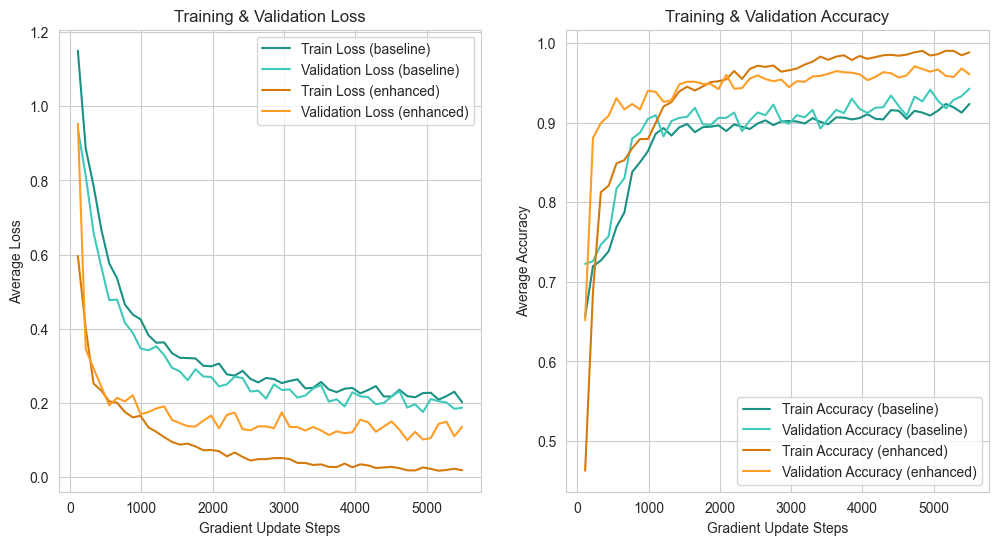

In [39]:
# Visualise the training results
def train_plots(fp_base, fp_enh):
    df_base = pd.read_csv(fp_base)
    df_enh = pd.read_csv(fp_enh)
    fig = plt.figure(figsize=(12, 6))
    sns.set_style("whitegrid")

    # Plot Loss graph
    fig.add_subplot(1, 2, 1)
    plt.plot(df_base["Gradient Update Steps"], df_base["Train Loss"], "-", color="#199183", label="Train Loss (baseline)")
    plt.plot(df_base["Gradient Update Steps"], df_base["Validation Loss"], "-", color="#40c9b9", label="Validation Loss (baseline)")
    plt.plot(df_enh["Gradient Update Steps"], df_enh["Train Loss"], "-", color="#d47a0d", label="Train Loss (enhanced)")
    plt.plot(df_enh["Gradient Update Steps"], df_enh["Validation Loss"], "-", color="#ff9d26", label="Validation Loss (enhanced)")
    plt.legend()
    plt.xlabel("Gradient Update Steps")
    plt.ylabel("Average Loss")
    plt.title("Training & Validation Loss")

    # Plot Accuracy Graph
    fig.add_subplot(1, 2, 2)
    plt.plot(df_base["Gradient Update Steps"], df_base["Train Accuracy"], "-", color="#199183", label="Train Accuracy (baseline)")
    plt.plot(df_base["Gradient Update Steps"], df_base["Validation Accuracy"], "-", color="#40c9b9", label="Validation Accuracy (baseline)")
    plt.plot(df_enh["Gradient Update Steps"], df_enh["Train Accuracy"], "-", color="#d47a0d", label="Train Accuracy (enhanced)")
    plt.plot(df_enh["Gradient Update Steps"], df_enh["Validation Accuracy"], "-", color="#ff9d26", label="Validation Accuracy (enhanced)")
    plt.legend()
    plt.xlabel("Gradient Update Steps")
    plt.ylabel("Average Accuracy")
    plt.title("Training & Validation Accuracy")

    plt.show()



train_plots("./bert_saved/BERTClassifier_base.csv", "./bert_saved/BERTClassifier_imp2.csv")


### &emsp; &emsp; &emsp; ii) Testing

In [74]:
# Prepare the test dataloader
test_dataloader = (DataLoader(
        StanceDataset(test_set, tokenizer, 256, 256), 
        batch_size=batch_size
    ))

In [75]:
# Extract the ground truths
y_true = []

# Split it up due to resources available
for batch in test_dataloader:
    inp_tok = batch["inp_tok"].to(device)
    inp_msk = batch["attn_msk"].to(device)
    targ = batch["target"].to(device)

    _, true = torch.max(targ, dim=1)
    y_true.extend(true.tolist())

In [76]:
# Load the baseline model for testing
test_model = BERTClassifier(model_name, 4, dropout_prob=1)
test_model.load_state_dict(torch.load("./bert_saved/BERTClassifier_base", weights_only=True))
test_model.eval().to(device)

y_pred_base = []
y_pred_base_prob0 = []
y_pred_base_prob1 = []
y_pred_base_prob2 = []
y_pred_base_prob3 = []

# Model prediction on test set
# NOTE: A softmax is applied on the output logits and also extracted to assist in the
#       threshold varying analyses later (ROC & PR curves)
for batch in test_dataloader:
    inp_tok = batch["inp_tok"].to(device)
    inp_msk = batch["attn_msk"].to(device)
    targ = batch["target"].to(device)

    model_pred = test_model(inp_tok, inp_msk)

    _, pred_base = torch.max(model_pred, dim=1)
    y_pred_base.extend(pred_base.tolist())

    # Use softmax to form a probability distribution over the output logits and save these too
    softmx = F.softmax(model_pred, dim=1)
    y_pred_base_prob0.extend(softmx[:, 0].tolist())
    y_pred_base_prob1.extend(softmx[:, 1].tolist())
    y_pred_base_prob2.extend(softmx[:, 2].tolist())
    y_pred_base_prob3.extend(softmx[:, 3].tolist())


In [77]:
# Load the enhanced model for testing
test_model = BERTClassifier(model_name, 4, dropout_prob=1)
test_model.load_state_dict(torch.load("./bert_saved/BERTClassifier_imp2", weights_only=True))
test_model.eval().to(device)
disp.clear_output()

y_pred_enh = []
y_pred_enh_prob0 = []
y_pred_enh_prob1 = []
y_pred_enh_prob2 = []
y_pred_enh_prob3 = []

for batch in test_dataloader:
    inp_tok = batch["inp_tok"].to(device)
    inp_msk = batch["attn_msk"].to(device)
    targ = batch["target"].to(device)
        
    model_pred = test_model(inp_tok, inp_msk)

    _, pred_enh = torch.max(model_pred, dim=1)
    y_pred_enh.extend(pred_enh.tolist())

    # Use softmax to form a probability distribution over the output logits and save these
    softmx = F.softmax(model_pred, dim=1)
    y_pred_enh_prob0.extend(softmx[:, 0].tolist())
    y_pred_enh_prob1.extend(softmx[:, 1].tolist())
    y_pred_enh_prob2.extend(softmx[:, 2].tolist())
    y_pred_enh_prob3.extend(softmx[:, 3].tolist())

In [78]:
# Save the test results
test_res = {
    "True": y_true,
    "Base_label": y_pred_base,
    "Base_prob0": y_pred_base_prob0,
    "Base_prob1": y_pred_base_prob1,
    "Base_prob2": y_pred_base_prob2,
    "Base_prob3": y_pred_base_prob3,
    "Enh_label": y_pred_enh,
    "Enh_prob0": y_pred_enh_prob0,
    "Enh_prob1": y_pred_enh_prob1,
    "Enh_prob2": y_pred_enh_prob2,
    "Enh_prob3": y_pred_enh_prob3
}

test_res = pd.DataFrame(test_res)
test_res.to_csv("./bert_saved/test_results.csv", index=False) 

In [79]:
# Load test Results
test_results = pd.read_csv("./bert_saved/test_results.csv")
test_results.head()

,True,Base_label,Base_prob0,Base_prob1,Base_prob2,Base_prob3,Enh_label,Enh_prob0,Enh_prob1,Enh_prob2,Enh_prob3
0,0,0,0.990493,0.005712,0.001842,0.001953,3,0.050861,0.050289,0.068757,0.830093
1,2,1,0.023395,0.454814,0.430468,0.091324,2,0.000998,0.184063,0.813340,0.001598
2,0,0,0.997182,0.001465,0.000753,0.000601,0,0.999641,0.000186,0.000067,0.000105
3,0,0,0.995911,0.001750,0.001064,0.001275,0,0.999647,0.000171,0.000060,0.000123
4,1,1,0.020381,0.447121,0.438968,0.093531,2,0.000594,0.035208,0.960201,0.003996


In [81]:
# Classification report on test_results (baseline)
print(metrics.classification_report(test_results["True"], test_results["Base_label"], 
                            target_names=["Unrelated", "Discuss", "Agree", "Disagree"],
                            zero_division=0.0))

              precision    recall  f1-score   support

   Unrelated       0.99      0.99      0.99     18349
     Discuss       0.68      0.84      0.75      4464
       Agree       0.53      0.42      0.47      1903
    Disagree       0.00      0.00      0.00       697

    accuracy                           0.89     25413
   macro avg       0.55      0.56      0.55     25413
weighted avg       0.87      0.89      0.88     25413



In [82]:
# Classification report on test_results (enhanced)
print(metrics.classification_report(test_results["True"], test_results["Enh_label"], 
                            target_names=["Unrelated", "Discuss", "Agree", "Disagree"],
                            zero_division=0.0))

              precision    recall  f1-score   support

   Unrelated       0.97      0.99      0.98     18349
     Discuss       0.78      0.67      0.72      4464
       Agree       0.46      0.60      0.52      1903
    Disagree       0.18      0.12      0.14       697

    accuracy                           0.88     25413
   macro avg       0.60      0.59      0.59     25413
weighted avg       0.88      0.88      0.88     25413



In [83]:
label_map

{'unrelated': 0, 'discuss': 1, 'agree': 2, 'disagree': 3}

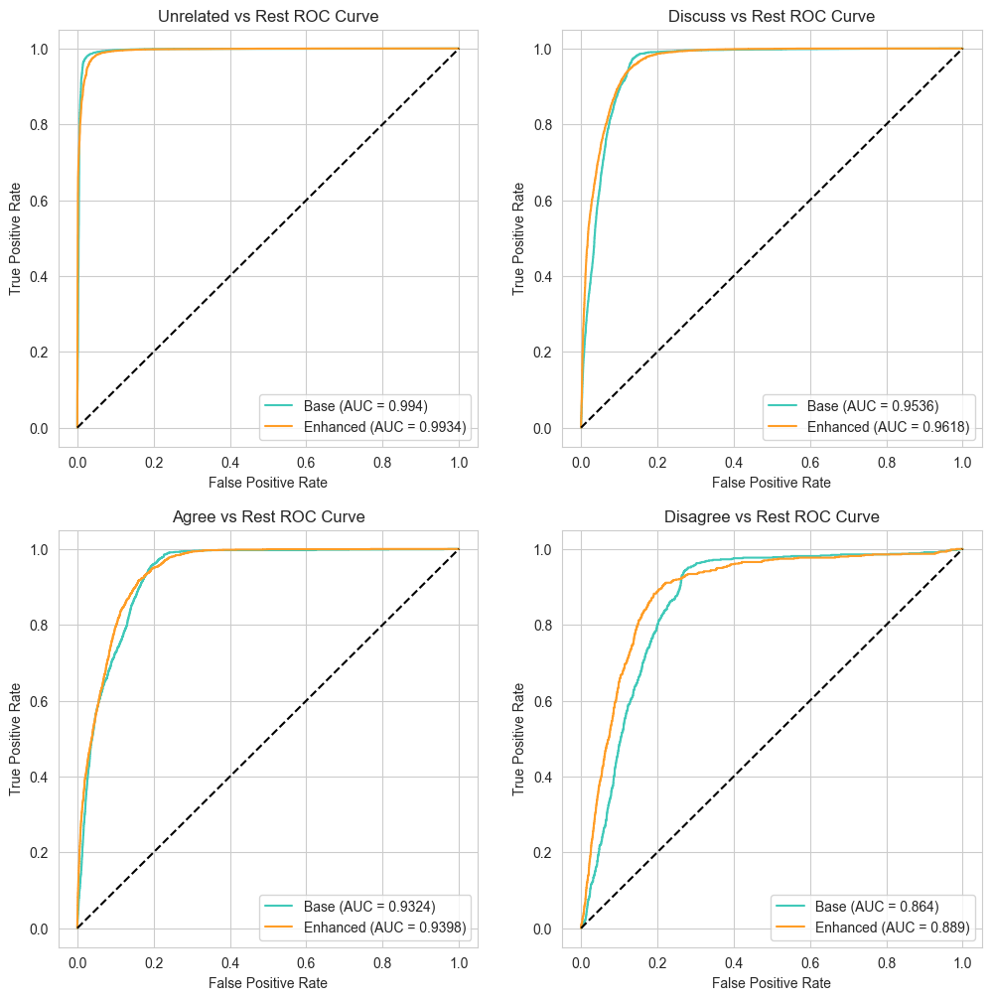

Base Model Thresholds
	 From 0.9976884126663208 to 0.0133867133408784
	 From 0.8645310401916504 to 0.0011701174080371
	 From 0.5063402652740479 to 0.0006104417843744
	 From 0.1424988955259323 to 0.0004537412896752

Improved Model Thresholds
	 From 0.999698519706726 to 0.0001147291623055
	 From 0.9991243481636048 to 0.0001189879549201
	 From 0.9971586465835572 to 4.773697219206952e-05
	 From 0.9922681450843812 to 3.713595651788637e-05


In [108]:
# ROC Curves
# Important to note that even though base model never has a high enough logit value to select disagree as shown above, it still has some skill at determining when 
#   it is more likely to be a disagree case or not, as demonstrated by the ROC curves (but note of course that the thresholds for this case are very low as expected)
fig = plt.figure(figsize=(12, 12))
sns.set_style("whitegrid")

threshes_base = {}
threshes_imp = {}

for label in label_map.keys():
    reassign = lambda x: 0 if x != label_map[label] else 1
    true_y = test_results["True"].apply(reassign)

    pred_y_base = test_results["Base_prob"+str(label_map[label])].values.tolist()
    pred_y_enh = test_results["Enh_prob"+str(label_map[label])].values.tolist()

    fpr_base, tpr_base, thresh_base = metrics.roc_curve(true_y, pred_y_base)
    curve_auc_base = metrics.auc(fpr_base, tpr_base)
    threshes_base[label.title()] = f"From {thresh_base[1]} to {thresh_base[-1]}"

    fpr_imp, tpr_imp, thresh_imp = metrics.roc_curve(true_y, pred_y_enh)
    curve_auc_imp = metrics.auc(fpr_imp, tpr_imp)
    threshes_imp[label.title()] = f"From {thresh_imp[1]} to {thresh_imp[-1]}"

    # Plot the ROC Curve
    fig.add_subplot(2, 2, label_map[label]+1)
    plt.plot(fpr_base, tpr_base, label=f"Base (AUC = {curve_auc_base:.4})", color="#40c9b9")
    plt.plot(fpr_imp, tpr_imp, label=f"Enhanced (AUC = {curve_auc_imp:.4})", color="#ff9d26")
    plt.plot([0, 1], [0, 1], "k--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"{label.title()} vs Rest ROC Curve")
    plt.legend()

plt.show()

# Reveal Thresholds
print("Base Model Thresholds")
for key in threshes_base.keys():
    print("\t", threshes_base[key])

print("\nImproved Model Thresholds")
for key in threshes_imp.keys():
    print("\t", threshes_imp[key])

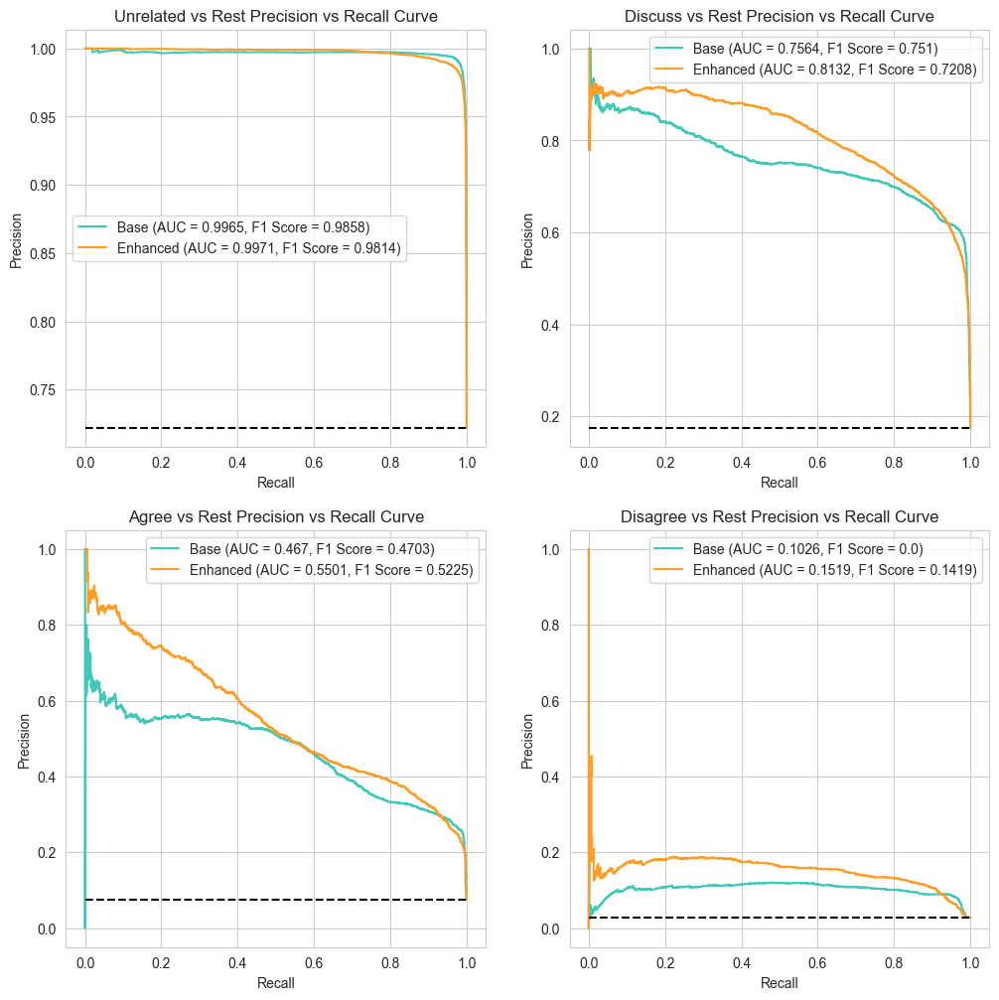

In [111]:
# Precision-Recall Curves
fig = plt.figure(figsize=(12, 12))
sns.set_style("whitegrid")


for label in label_map.keys():
    reassign = lambda x: 0 if x != label_map[label] else 1
    true_y = test_results["True"].apply(reassign)
    base_y = test_results["Base_label"].apply(reassign)
    enh_y = test_results["Enh_label"].apply(reassign)

    pred_y_base = test_results["Base_prob"+str(label_map[label])].values.tolist()
    pred_y_enh = test_results["Enh_prob"+str(label_map[label])].values.tolist()


    prec_base, rec_base, _ = metrics.precision_recall_curve(true_y, pred_y_base)
    base_f1, base_auc = metrics.f1_score(true_y, base_y), metrics.auc(rec_base, prec_base)

    prec_enh, rec_enh, _ = metrics.precision_recall_curve(true_y, pred_y_enh)
    enh_f1, enh_auc = metrics.f1_score(true_y, enh_y), metrics.auc(rec_enh, prec_enh)
    

    bound = len(true_y[true_y==1]) / len(true_y)

    # Plot the Precision recall curve
    fig.add_subplot(2, 2, label_map[label]+1)
    plt.plot(rec_base, prec_base, label=f"Base (AUC = {base_auc:.4}, F1 Score = {base_f1:.4})", color="#40c9b9")
    plt.plot(rec_enh, prec_enh, label=f"Enhanced (AUC = {enh_auc:.4}, F1 Score = {enh_f1:.4})", color="#ff9d26")
    plt.plot([0, 1], [bound, bound], "k--")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title(f"{label.title()} vs Rest Precision vs Recall Curve")
    plt.legend()

plt.show()

### &emsp; &emsp; b) Model Prompting

### &emsp; &emsp; &emsp; i) The Prompting Loop

In [13]:
label_map = {
    "unrelated": 0,
    "discuss": 1, 
    "agree": 2,
    "disagree": 3
}

In [14]:
# Run IMPORTS and 1a
# Create a test set to test the LLMs performance
# NOTE: We are using a limited number of samples for efficiency (stratified sampling)
test_set = combine_df(test_bodies_df, test_stances_df)
test_set["Weights"] = test_set["Stance"].map(lambda x: 1)
test_set = test_set.sample(n=500, weights="Weights", random_state=21)
test_truth = test_set["Stance"].map(lambda x: label_map[x])

In [15]:
test_set.head()

,Body ID,articleBody,Headline,Stance,Weights
1238,145,apple has multiple versions of its upcoming sm...,isis executioner jihadi john allegedly wounded...,unrelated,1
7347,929,washington dc – in the boldest takeover of pre...,joan rivers doctor denies unauthorized procedu...,unrelated,1
18321,1990,street harassment is something that happens to...,india angry bride marries guest after original...,unrelated,1
549,52,diane foley told abc news that us officials th...,hp to split into two businesses report,unrelated,1
5233,705,a 25yearold south african man has lost the use...,mans girlfriend pours acid on his penis after ...,agree,1


In [16]:
test_set.Stance.value_counts()

Stance
unrelated    353
discuss      104
agree         27
disagree      16
Name: count, dtype: int64

In [17]:
# Establish consistent input title and article lengths
title_len = 32
article_len = 256

# Use to find examples from the training set
train_set = combine_df(train_bodies_df, train_stances_df)
row = train_set.loc[train_set["Stance"] == "disagree"].iloc[0]
print(" ".join(row.Headline.split(" ")[:title_len]))
print(" ".join(row.articleBody.split(" ")[:article_len]))

batmobile stolen from batman v superman dawn of justice set zack snyder knows who did it
this rumour is ridiculous but its pretty amusing and not all that hard to believe given where zack snyder is currently shooting batman v superman dawn of justice according to bleeding cool who are often pretty reliable on the rumour front the scuttlebutt from sources in detroit is that one of the batmobile models being used in the filming of batman vs superman has gone missing believed stolen seriously the best set video we can get of the iconic vehicle in action is from about 300 feet away but someone got close enough to steal one of the damn things as i said this is hard to believe and weve heard nothing official on this but if you see the newest version of the batmobile charging around the streets of detroit or even on ebay its probably been stolen remember you can check out the first official image of the batmobile by clicking hereupdate false alarm the detroit free press have confirmed that th

In [18]:
# We use the TinyLlama model for the prompting
model_name = "TinyLlama/TinyLlama-1.1B-Chat-v1.0"
pipe = pipeline("text-generation", model_name, use_fast=False) 

Device set to use cuda:0


In [19]:
# This is the variable that stores the main prompt, it can be changed to find the 
#   prompt that works best

# main_prompt = """\
#     Instructions:
#         1. Determine the most accurate relationship between the input TITLE and ARTICLE pair.
#         2. Classify this relationship according to the CLASS_LABELS and CLASS_DEFINITIONS below.

#     CLASS_LABELS: {Unrelated, Discuss, Agree, Disagree}

#     CLASS_DEFINITIONS: {
#         Unrelated: The input ARTICLE does not refer to the same topic as the input TITLE.
#         Discuss: The input ARTICLE refers to the same topic as the input TITLE.
#         Agree: The input ARTICLE agrees with the content in the input TITLE.
#         Disagree: The input ARTICLE disagrees with the content in the input TITLE.
#     }
# """

In [20]:
# These are some of the examples that can be used to help the model understand the task better
# examples = {
#     "Unrelated": {
#         "Title": "soldier shot parliament locked down after gunfire erupts at war memorial",
#         "Article": "a small meteorite crashed into a wooded area in nicaraguas capital of managua overnight the government said sunday residents reported hearing a mysterious boom that left a 16foot deep crater near the citys airport the associated press reports government spokeswoman rosario murillo said a committee formed by the government to study the event determined it was a relatively small meteorite that appears to have come off an asteroid that was passing close to earth housesized asteroid 2014 rc which measured 60 feet in diameter skimmed the earth this weekend abc news reports murillo said nicaragua will ask international experts to help local scientists in understanding what happenedthe crater left by the meteorite had a radius of 39 feet and a depth of 16 feet  said humberto saballos a volcanologist with the nicaraguan institute of territorial studies who was on the committee he said it is still not clear if the meteorite disintegrated or was buriedhumberto garcia of the astronomy center at the national autonomous university of nicaragua said the meteorite could be related to an asteroid that was forecast to pass by the planet saturday nightwe have to study it more because it could be ice or rock he saidwilfried strauch an adviser to the institute of territorial studies said it was very strange that no one reported a streak of light we have to ask if anyone has a photo or somethinglocal residents reported hearing a loud boom saturday night but said they didnt see anything strange in the skyi was sitting on my"
#     },
#     "Discuss": {
#         "Title": "it begins hazmatwearing passenger spotted at airport",
#         "Article": "last week we hinted at what was to come as ebola fears spread across america today we get confirmation as the daily caller reports one passenger at dulles international airport outside washington dc is apparently not taking any chances a female passenger dressed in a hazmat suit  complete with a full body gown mask and gloves  was spotted wednesday waiting for a flight at the airport source the daily callerwe particularly liked the jcpenney bag  maybe thats a new business line for the bankrupt retailer    on a side note try halloween stores if you need a hazmat suit in a hurry"
#     },
#     "Agree": {
#         "Title": "what was fake on the internet this week obama’s peace prize pumpkinspice condoms and insane winter snow",
#         "Article": "there is so much fake stuff on the internet in any given week that we’ve grown tired of debunking it all fake twitter fights fake dhl ads amazing viral video nope — a jimmy kimmel stuntso rather than take down each and every undeservedly viral story that crosses our monitors each week we’re rounding them all up in a quick onceaweek friday debunk of fake photos misleading headlines and bad studies that you probably shouldn’t share over the weekendready here’s what was fake on the internet this week1 the nobel committee doesn’t “regret” giving president obama the peace prize according to an invented “news release” uploaded to scribd by the prominent blogger and antiwar activist david swanson the nobel institute can’t retract obama’s 2009 peace prize — but wishes it could “it remains the obligation of the committee to disassociate itself from actions taken by laureates that frustrate rather than advancing sic the fraternity between nations” the statement reads protip international organizations rarely make glaring grammatical errors in major statements “the committee therefore joins with the public statements of several nobel peace laureates in expressing its regrets over the conduct of the 2009 prize recipient” the announcement has since been picked up by a number of rightwing outlets including before it’s news the only problem of course it isn’t truedear internet the nobel committee ″regrets” giving obama the 2009 peace prize story is bogus i just spoke with the head of the institute2 there is nosuch thing as a “pumpkinspiceflavored condom” though considering the social media"
#     },
#     "Disagree": {
#         "Title": "batmobile stolen from batman v superman dawn of justice set zack snyder knows who did it",
#         "Article": "this rumour is ridiculous but its pretty amusing and not all that hard to believe given where zack snyder is currently shooting batman v superman dawn of justice according to bleeding cool who are often pretty reliable on the rumour front the scuttlebutt from sources in detroit is that one of the batmobile models being used in the filming of batman vs superman has gone missing believed stolen seriously the best set video we can get of the iconic vehicle in action is from about 300 feet away but someone got close enough to steal one of the damn things as i said this is hard to believe and weve heard nothing official on this but if you see the newest version of the batmobile charging around the streets of detroit or even on ebay its probably been stolen remember you can check out the first official image of the batmobile by clicking hereupdate false alarm the detroit free press have confirmed that the batmobile is safe of the set of batman v superman dawn of justice with detroit police spokesman sgt michael woody saying that they reached out to the producers of the movie to confirm that it had not been stolen the batmobile is safe in the batcave where it belongs woody said in a brief statement which should help us all sleep a little easiter tonight oh well a fun story while it lasted i think we can all agreesource bleeding cool"
#     }
# }

In [ ]:
# Store the LLMs predictions
model_pred = []

# Used in debugging to analyse the results from different classes
counter = 0  

# Iterate through the dataset to prompt on each instance
for row in range(len(test_set)):

    # Create the chat model
    lm = models.Transformers(pipe.model, pipe.tokenizer)
    disp.clear_output()

    # Extract the test instance input data
    inp_article = test_set.iloc[row].articleBody
    inp_title = test_set.iloc[row].Headline

    # Truncate this text to a reasonable size
    inp_title = " ".join(inp_title.split(" ")[:title_len])
    inp_article = " ".join(inp_article.split(" ")[:article_len])

    # This is used to build the chat template for each prediction
    # It, too, can be changed to try and improve the results

    # messages = [
    #         {
    #             "role": "system",
    #             "content": "You are an intelligent Stance Detection and Classification Model for news articles."
    #         },
    #         {
    #             "role": "user",
    #             "content": main_prompt
    #         },

    #         #Examples
    #         {"role": "user", "content": "Title:\n\t" + examples["Unrelated"]["Title"] + "." + "\n\nArticle:\n\t" + examples["Unrelated"]["Article"] + "."},
    #         {"role": "assistant", "content": "Unrelated"},

    #         {"role": "user", "content": "Title:\n\t" + examples["Discuss"]["Title"] + "." + "\n\nArticle:\n\t" + examples["Discuss"]["Article"] + "."},
    #         {"role": "assistant", "content": "Discuss"},

    #         {"role": "user", "content": "Title:\n\t" + examples["Agree"]["Title"] + "." + "\n\nArticle:\n\t" + examples["Agree"]["Article"] + "."},
    #         {"role": "assistant", "content": "Agree"},

    #         {"role": "user", "content": "Title:\n\t" + examples["Disagree"]["Title"] + "." + "\n\nArticle:\n\t" + examples["Disagree"]["Article"] + "."},
    #         {"role": "assistant", "content": "Disagree"},


    #         {
    #             "role": "user",
    #             "content": "Title:\n" + inp_title + "." + "\n\nArticle:\n" + inp_article + "."
    #         }
    #     ]

    # Build the prompt using the model's tokenizer's chat template
    prompt = pipe.tokenizer.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    prompt = prompt.replace("</s>", "")

    # Extract the model's prediction, using the select method to restrict the output appropriately
    out = lm + prompt + select(["Unrelated", "Discuss", "Agree", "Disagree"], name="pred_label")

    # Used to print out the example template
    # if test_set.iloc[row].Stance == "unrelated":
    #     counter += 1
    #     if counter == 1:
    #         print(out)
    #         break

    model_pred.append(out["pred_label"].lower())


# Save the test results for future analysis
save_results = {
    "True": test_truth,
    "Pred": model_pred
}
save_df = pd.DataFrame(save_results)
save_df["Pred"] = save_df["Pred"].apply(lambda x: label_map[x])
save_df.to_csv("./prompt_res/prompt_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + ".csv", index=False)

### &emsp; &emsp; &emsp; ii) Templates and Results

#### &emsp; &emsp; &emsp; &emsp; Baseline Prompt

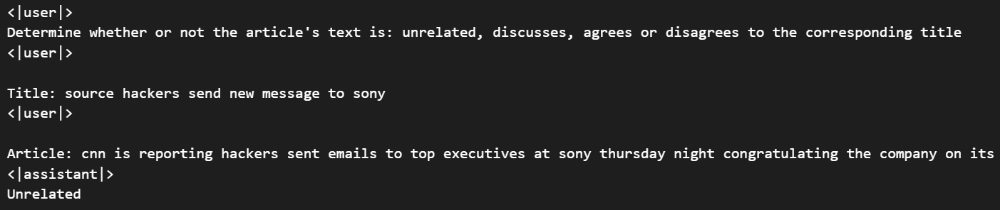

In [22]:
# Baseline Prompt:
# messages = [
#         {
#             "role": "user",
#             "content": "Determine whether or not the article's text is: unrelated, discusses, agrees or disagrees to the corresponding title"
#         },
#         {
#             "role": "user",
#             "content": "\nTitle: " + inp_title
#         },
#         {
#             "role": "user",
#             "content": "\nArticle: " + inp_article
#         }
#     ]

# Display the prompt example
disp.Image(filename="./prompt_res/prompt_base.png") 

In [24]:
lm_test = pd.read_csv("./prompt_res/prompt_base.csv")
print(metrics.classification_report(lm_test["True"], lm_test["Pred"], 
                            target_names=["Unrelated", "Discuss", "Agree", "Disagree"],
                            zero_division=0.0))

              precision    recall  f1-score   support

   Unrelated       0.71      1.00      0.83       353
     Discuss       0.00      0.00      0.00       104
       Agree       0.00      0.00      0.00        27
    Disagree       0.00      0.00      0.00        16

    accuracy                           0.71       500
   macro avg       0.18      0.25      0.21       500
weighted avg       0.50      0.71      0.59       500



#### &emsp; &emsp; &emsp; &emsp; Intermediate Prompt

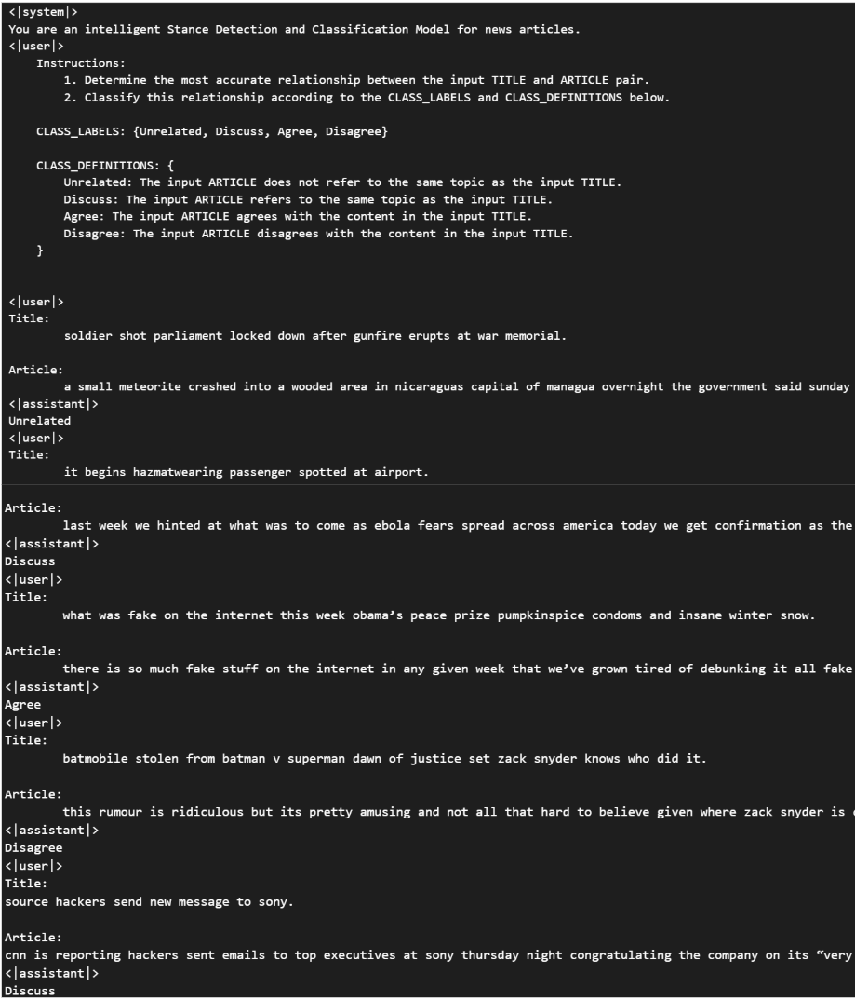

In [23]:
# Intermediate Prompt:
# main_prompt = """\
#     Instructions:
#         1. Determine the most accurate relationship between the input TITLE and ARTICLE pair.
#         2. Classify this relationship according to the CLASS_LABELS and CLASS_DEFINITIONS below.

#     CLASS_LABELS: {Unrelated, Discuss, Agree, Disagree}

#     CLASS_DEFINITIONS: {
#         Unrelated: The input ARTICLE does not refer to the same topic as the input TITLE.
#         Discuss: The input ARTICLE refers to the same topic as the input TITLE.
#         Agree: The input ARTICLE agrees with the content in the input TITLE.
#         Disagree: The input ARTICLE disagrees with the content in the input TITLE.
#     }
# """

# examples = {
#     "Unrelated": {
#         "Title": "soldier shot parliament locked down after gunfire erupts at war memorial",
#         "Article": "a small meteorite crashed into a wooded area in nicaraguas capital of managua overnight the government said sunday residents reported hearing a mysterious boom that left a 16foot deep crater near the citys airport the associated press reports government spokeswoman rosario murillo said a committee formed by the government to study the event determined it was a relatively small meteorite that appears to have come off an asteroid that was passing close to earth housesized asteroid 2014 rc which measured 60 feet in diameter skimmed the earth this weekend abc news reports murillo said nicaragua will ask international experts to help local scientists in understanding what happenedthe crater left by the meteorite had a radius of 39 feet and a depth of 16 feet  said humberto saballos a volcanologist with the nicaraguan institute of territorial studies who was on the committee he said it is still not clear if the meteorite disintegrated or was buriedhumberto garcia of the astronomy center at the national autonomous university of nicaragua said the meteorite could be related to an asteroid that was forecast to pass by the planet saturday nightwe have to study it more because it could be ice or rock he saidwilfried strauch an adviser to the institute of territorial studies said it was very strange that no one reported a streak of light we have to ask if anyone has a photo or somethinglocal residents reported hearing a loud boom saturday night but said they didnt see anything strange in the skyi was sitting on my"
#     },
#     "Discuss": {
#         "Title": "it begins hazmatwearing passenger spotted at airport",
#         "Article": "last week we hinted at what was to come as ebola fears spread across america today we get confirmation as the daily caller reports one passenger at dulles international airport outside washington dc is apparently not taking any chances a female passenger dressed in a hazmat suit  complete with a full body gown mask and gloves  was spotted wednesday waiting for a flight at the airport source the daily callerwe particularly liked the jcpenney bag  maybe thats a new business line for the bankrupt retailer    on a side note try halloween stores if you need a hazmat suit in a hurry"
#     },
#     "Agree": {
#         "Title": "what was fake on the internet this week obama’s peace prize pumpkinspice condoms and insane winter snow",
#         "Article": "there is so much fake stuff on the internet in any given week that we’ve grown tired of debunking it all fake twitter fights fake dhl ads amazing viral video nope — a jimmy kimmel stuntso rather than take down each and every undeservedly viral story that crosses our monitors each week we’re rounding them all up in a quick onceaweek friday debunk of fake photos misleading headlines and bad studies that you probably shouldn’t share over the weekendready here’s what was fake on the internet this week1 the nobel committee doesn’t “regret” giving president obama the peace prize according to an invented “news release” uploaded to scribd by the prominent blogger and antiwar activist david swanson the nobel institute can’t retract obama’s 2009 peace prize — but wishes it could “it remains the obligation of the committee to disassociate itself from actions taken by laureates that frustrate rather than advancing sic the fraternity between nations” the statement reads protip international organizations rarely make glaring grammatical errors in major statements “the committee therefore joins with the public statements of several nobel peace laureates in expressing its regrets over the conduct of the 2009 prize recipient” the announcement has since been picked up by a number of rightwing outlets including before it’s news the only problem of course it isn’t truedear internet the nobel committee ″regrets” giving obama the 2009 peace prize story is bogus i just spoke with the head of the institute2 there is nosuch thing as a “pumpkinspiceflavored condom” though considering the social media"
#     },
#     "Disagree": {
#         "Title": "batmobile stolen from batman v superman dawn of justice set zack snyder knows who did it",
#         "Article": "this rumour is ridiculous but its pretty amusing and not all that hard to believe given where zack snyder is currently shooting batman v superman dawn of justice according to bleeding cool who are often pretty reliable on the rumour front the scuttlebutt from sources in detroit is that one of the batmobile models being used in the filming of batman vs superman has gone missing believed stolen seriously the best set video we can get of the iconic vehicle in action is from about 300 feet away but someone got close enough to steal one of the damn things as i said this is hard to believe and weve heard nothing official on this but if you see the newest version of the batmobile charging around the streets of detroit or even on ebay its probably been stolen remember you can check out the first official image of the batmobile by clicking hereupdate false alarm the detroit free press have confirmed that the batmobile is safe of the set of batman v superman dawn of justice with detroit police spokesman sgt michael woody saying that they reached out to the producers of the movie to confirm that it had not been stolen the batmobile is safe in the batcave where it belongs woody said in a brief statement which should help us all sleep a little easiter tonight oh well a fun story while it lasted i think we can all agreesource bleeding cool"
#     }
# }

# messages = [
#         {
#             "role": "system",
#             "content": "You are an intelligent Stance Detection and Classification Model for news articles."
#         },
#         {
#             "role": "user",
#             "content": main_prompt
#         },

#         #Examples
#         {"role": "user", "content": "TITLE:\n\t" + examples["Unrelated"]["Title"] + "." + "\n\ARTICLE:\n\t" + examples["Unrelated"]["Article"] + "."},
#         {"role": "assistant", "content": "Unrelated"},

#         {"role": "user", "content": "TITLE:\n\t" + examples["Discuss"]["Title"] + "." + "\n\nARTICLE:\n\t" + examples["Discuss"]["Article"] + "."},
#         {"role": "assistant", "content": "Discuss"},

#         {"role": "user", "content": "TITLE:\n\t" + examples["Agree"]["Title"] + "." + "\n\nARTICLE:\n\t" + examples["Agree"]["Article"] + "."},
#         {"role": "assistant", "content": "Agree"},

#         {"role": "user", "content": "TITLE:\n\t" + examples["Disagree"]["Title"] + "." + "\n\nARTICLE:\n\t" + examples["Disagree"]["Article"] + "."},
#         {"role": "assistant", "content": "Disagree"},


#         {
#             "role": "user",
#             "content": "TITLE:\n" + inp_title + "." + "\n\nARTICLE:\n" + inp_article + "."
#         }
#     ]

# Display the prompt example (note that the image is cropped)
disp.Image(filename="./prompt_res/prompt_intermediate.png") 

In [24]:
lm_test = pd.read_csv("./prompt_res/prompt_intermediate.csv")
print(metrics.classification_report(lm_test["True"], lm_test["Pred"], 
                            target_names=["Unrelated", "Discuss", "Agree", "Disagree"],
                            zero_division=0.0))

              precision    recall  f1-score   support

   Unrelated       0.76      0.12      0.21       353
     Discuss       0.21      0.87      0.33       104
       Agree       0.14      0.04      0.06        27
    Disagree       0.00      0.00      0.00        16

    accuracy                           0.27       500
   macro avg       0.28      0.26      0.15       500
weighted avg       0.59      0.27      0.22       500



#### &emsp; &emsp; &emsp; &emsp; Final Prompt

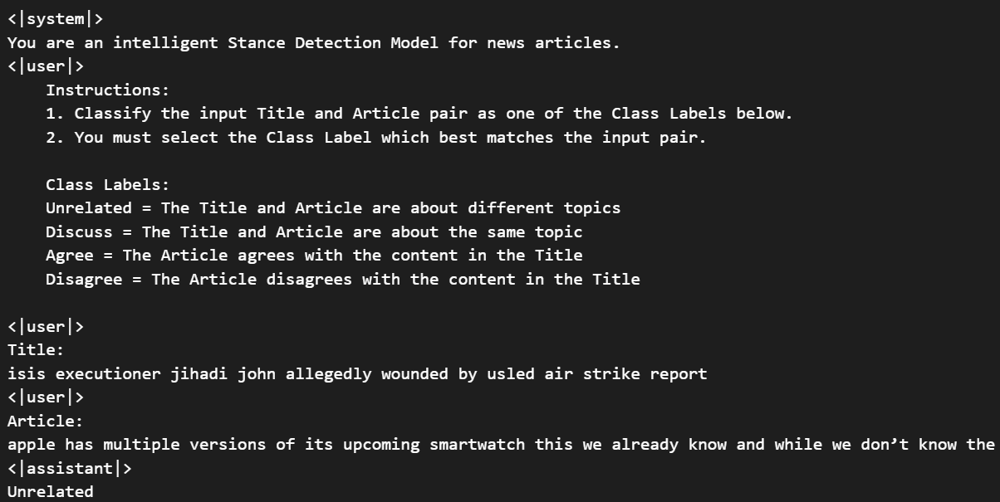

In [31]:
# Final Prompt:
# main_prompt = """\
#     Instructions:
#     1. Classify the input Title and Article pair as one of the Class Labels below.
#     2. You must select the Class Label which best matches the input pair.

#     Class Labels:
#     Unrelated = The Title and Article are about different topics
#     Discuss = The Title and Article are about the same topic
#     Agree = The Article agrees with the content in the Title
#     Disagree = The Article disagrees with the content in the Title
#     """

#     messages = [
#         {
#             "role": "system",
#             "content": "You are an intelligent Stance Detection Model for news articles."
#         },
#         {
#             "role": "user",
#             "content": main_prompt
#         },
#         {
#             "role": "user",
#             "content": "Title:\n" + inp_title
#         },
#         {
#             "role": "user",
#             "content": "Article:\n" + inp_article
#         }
#     ]

# Display the prompt example (note that the image is cropped)
disp.Image(filename="./prompt_res/prompt_final.png") 

In [32]:
lm_test = pd.read_csv("./prompt_res/prompt_final.csv")
print(metrics.classification_report(lm_test["True"], lm_test["Pred"], 
                            target_names=["Unrelated", "Discuss", "Agree", "Disagree"],
                            zero_division=0.0))

              precision    recall  f1-score   support

   Unrelated       0.70      0.75      0.72       353
     Discuss       0.32      0.08      0.12       104
       Agree       0.00      0.00      0.00        27
    Disagree       0.03      0.19      0.05        16

    accuracy                           0.55       500
   macro avg       0.26      0.25      0.22       500
weighted avg       0.56      0.55      0.54       500



### &emsp; &emsp; c) Chain of Thoughts

### &emsp; &emsp; &emsp; i) The Prompting Loop

In [13]:
label_map = {
    "unrelated": 0,
    "discuss": 1, 
    "agree": 2,
    "disagree": 3
}

In [14]:
# Run IMPORTS and 1A

# Rebuilding these variables mean we use the raw web-scraped data (for grammar and punctuation)
train_bodies_df = pd.read_csv("fnc-1/train_bodies.csv")
train_stances_df = pd.read_csv("fnc-1/train_stances.csv")

test_bodies_df = pd.read_csv("fnc-1/competition_test_bodies.csv")
test_stances_df = pd.read_csv("fnc-1/competition_test_stances.csv")

# Create a test set to test the LLMs performance
test_set = combine_df(test_bodies_df, test_stances_df)#.sample(n=100, weights="Stance",)
test_set["Weights"] = test_set["Stance"].map(lambda x: 1)
test_set = test_set.sample(n=500, weights="Weights", random_state=21)   # using a limited number of samples for efficiency (stratified sampling)
test_truth = test_set["Stance"].map(lambda x: label_map[x])

In [15]:
# Again, for truncating long inputs
title_len = 32
article_len = 100

# Use to find examples from the training set
train_set = combine_df(train_bodies_df, train_stances_df)
row = train_set.loc[train_set["Stance"] == "disagree"].iloc[0]
print(" ".join(row.Headline.split(" ")[:title_len]))
print(" ".join(row.articleBody.split(" ")[:article_len]))

Batmobile Stolen From "Batman v Superman: Dawn of Justice" Set, Zack Snyder Knows Who Did It
This rumour is ridiculous, but it's pretty amusing and not all that hard to believe given where Zack Snyder is currently shooting Batman v Superman: Dawn of Justice. According to Bleeding Cool (who are often pretty reliable on the rumour front), "The scuttlebutt from sources in Detroit is that one of the Batmobile models being used in the filming of Batman Vs. Superman has gone missing, believed stolen." Seriously? The best set video we can get of the iconic vehicle in action is from about 300 feet away, but someone got close enough to steal one of the damn things?


In [16]:
# Build the TinyLlama model pipeline
model_name = "TinyLlama/TinyLlama-1.1B-Chat-v1.0"
pipe = pipeline("text-generation", model_name, use_fast=False) 

Device set to use cuda:0


In [23]:
# Captures the model's predictions for each test instance
model_pred = []

# Captures the test instances that resulted in unknown errors
error_drop = []

# For debugging/printing results at different classes
counter = 0


# The main testing loop
for row in range(len(test_set)):

    """REMOVE THIS PART FOR FULL INFERENCE"""
    row += 4
    """-----------------------------------"""

    # Build the model
    lm = models.Transformers(pipe.model, pipe.tokenizer)
    disp.clear_output()

    # Extract the instance inputs
    inp_article = test_set.iloc[row].articleBody
    inp_title = test_set.iloc[row].Headline

    # Truncate this text to a reasonable size
    inp_title = " ".join(inp_title.split(" ")[:title_len])
    inp_article = " ".join(inp_article.split(" ")[:article_len])


    # The first prompt used is to form a brief summary of the article 
    #   by associating an appropriate title with it. This was found to greatly
    #   improve TinyLlama's reasoning in the future, likely due to limited context capacity
    #################################################
    first_prompt = """\
    What is a concise title for the given text?
    """
    first_messages = [
            {
                "role": "user",
                "content": inp_article + "...\n\n" + first_prompt + "\n"
            },
        ]
    prompt = pipe.tokenizer.apply_chat_template(first_messages, tokenize=False, add_generation_prompt=True)
    prompt = prompt.replace("</s>", "")
    
    # NOTE: these clauses are used to naiively capture errors, which were unable
    #       to be resolved. In theory, a different testing instance/set could be used, 
    #       but this would also harm the validity of the comparisons later.
    try:
        lm += prompt + gen(max_tokens=50, name="gen_title") +"\n"
    except:
        counter += 1
        error_drop.append(row)
        continue
    #################################################



    

    # This is the main prompt for establishing if the input article and title are
    #   related or not (using the article title above)
    # We use inductive reasoning prompts here to assess the model's understanding of the
    #   task.
    #################################################
    second_prompt = f"""
    Instructions:
        1. Identify the subject of TEXT_1.
        2. Identify the subject of TEXT_2.
        3. Are these subjects similar or not?
    
    """
    second_messages = [
            {
                "role": "system",
                "content": "You are an unbiased expert at determining whether or not two pieces of text are similar or not."
            },
            {
                "role": "user",
                "content": "\n" + f"TEXT_1={{{lm["gen_title"]}}}" + "\n"
                #"content": "\n" + f"TEXT_1={{{inp_article}}}" + "\n"
            },
            {
                "role": "user",
                "content": "\n" + f"TEXT_2={{{inp_title}}}" + "\n"
            },
            {
                "role": "user",
                "content": "\n" + second_prompt + "\n"
            },
        ]
    prompt = pipe.tokenizer.apply_chat_template(second_messages, tokenize=False, add_generation_prompt=True)
    prompt = prompt.replace("</s>", "")
    try:
        lm += prompt + "\nLet's use simple step by step inductive reasoning.\n" + gen(max_tokens=250) + "\n"
    except:
        counter += 1
        error_drop.append(row)
        continue
    #################################################    



    # In this prompt, we make the model conclude if the two inputs are similar or not similar
    #   (these keywords were found to be best for determining if the topics are related or not)
    #################################################
    related_decision = [
            {
                "role": "user",
                "content": """\nTherefore, are the subjects similar or not?\n""" 
            },
        ]
    prompt = pipe.tokenizer.apply_chat_template(related_decision, tokenize=False, add_generation_prompt=True)
    prompt = prompt.replace("</s>", "")

    # We use the guidance module's select function to restrict the output accordingly,
    #   capturing it as a variable that can be branched on for further classification if needed
    try:
        lm += prompt + select(["similar", "not similar"], name="first_class") + "\n"
    except:
        counter += 1
        error_drop.append(row)
        continue
    #################################################


    # """REMOVE THIS PART FOR FULL INFERENCE"""
    # print(lm)
    # """-----------------------------------"""



    
    # If the prediction was "not similar", we can conclude that the model predicted it as "Unrelated"
    if lm["first_class"] == "not similar":
        model_pred.append("unrelated")
    
    # Else, if the prediction was "similar", we can create a new prompt with the input data
    #   to instead focus on distinguishing between the Discuss, Agree and Disagree labels
    else:
        
        # Reset the LM (allow for the same computational capacity for each subtask!)
        article_summary = lm["gen_title"]
        lm = models.Transformers(pipe.model, pipe.tokenizer)
        disp.clear_output()


        # This is the main prompt for the subsequent classification task
        # This is what was found to generate the most well reasoned results (on average)
        #################################################
        next_prompt1 = f"""
        CLASS_DEFINITIONS={{
        "Agree": "The TEXT_2 topic agrees with the TEXT_1 topic."
        "Disagree": "The TEXT_2 topic disagrees with the TEXT_1 topic."
        "Impartial": "The TEXT_2 topic is impartial to the TEXT_1 topic."
        }}
            
        """
        next_prompt2 = f"""
        Instructions:
            1. Identify the topic of TEXT_1.
            2. Identify the topic of TEXT_2.
            3. Determine the CLASS_DEFINITION entry which most accurately describes both topics.
            4. Output the entry key for step 3's CLASS_DEFINITION.

        """
        next_messages = [
                {
                    "role": "system",
                    "content": "You are now an unbiased expert at Stance Detection between 3 different classes ('Agree', 'Disagree' & 'Impartial')."
                },
                {
                    "role": "user",
                    "content": "\n" + next_prompt2 + next_prompt1 + "\n"
                },
                {
                    "role": "user",
                    "content": "\n" + f"TEXT_1={{{inp_title}}}" + "\n"
                },
                {
                    "role": "user",
                    "content": "\n" + f"TEXT_2={{{article_summary}}}" + "\n"
                    #"content": "\n" + f"TEXT_2={{{inp_article}}}" + "\n"
                },
            ]
        prompt = pipe.tokenizer.apply_chat_template(next_messages, tokenize=False, add_generation_prompt=True)
        prompt = prompt.replace("</s>", "")
        try:
            lm += prompt + "\nLet's use simple inductive reasoning strictly comprised of 4 steps.\n" + gen(max_tokens=250) + "\n"
        except:
            counter += 1
            error_drop.append(row)
            continue
        #################################################

        
        # This prompt was also found to be best to encourage the model to use its inductive reasoning
        #   to conclude an appropriate answer
        #################################################
        final_decision = [
            {
                "role": "user",
                "content": """\nTherefore, the entry key used in step 4 of the inductive reasoning is...\n""" 
            }
            ]
        prompt = pipe.tokenizer.apply_chat_template(final_decision, tokenize=False, add_generation_prompt=True)
        prompt = prompt.replace("</s>", "")
        #lm += prompt + gen(max_tokens=250) + "\n" + select(["'Agree'", "'Disagree'", "'Impartial'"], name="last_class")
        try:
            lm += prompt + select(["'Agree'", "'Disagree'", "'Impartial'"], name="last_class")
        except:
            counter += 1
            error_drop.append(row)
            continue
        #################################################


        # Extract the final classifications
        if lm["last_class"] == "'Agree'":
            model_pred.append("agree")
        elif lm["last_class"] == "'Disagree'":
            model_pred.append("disagree")
        else:
            model_pred.append("discuss")


    """REMOVE THIS PART FOR FULL INFERENCE"""
    print(lm)
    print(f"The correct answer is {test_set.iloc[row].Stance} and the model predicted {model_pred[-1]}")
    break

<|system|>
You are now an unbiased expert at Stance Detection between 3 different classes ('Agree', 'Disagree' & 'Impartial').
<|user|>


        Instructions:
            1. Identify the topic of TEXT_1.
            2. Identify the topic of TEXT_2.
            3. Determine the CLASS_DEFINITION entry which most accurately describes both topics.
            4. Output the entry key for step 3's CLASS_DEFINITION.

        
        CLASS_DEFINITIONS={
        "Agree": "The TEXT_2 topic agrees with the TEXT_1 topic."
        "Disagree": "The TEXT_2 topic disagrees with the TEXT_1 topic."
        "Impartial": "The TEXT_2 topic is impartial to the TEXT_1 topic."
        }
            
        

<|user|>

TEXT_1={Man's Girlfriend Pours Acid On His Penis After He Covertly Recorded Their Sex Session}

<|user|>

TEXT_2={A 25-year-old South African man loses the use of his penis after an acid attack by his angry 17-year-old girlfriend.}

<|assistant|>

Let's use simple inductive reasoning strictly

In [43]:
# Save the results of the test
filtered_truth = test_truth.drop(test_truth.index[error_drop])
save_results = {
    "True": filtered_truth,
    "Pred": model_pred
}
save_df = pd.DataFrame(save_results)
save_df["Pred"] = save_df["Pred"].apply(lambda x: label_map[x])
save_df.to_csv("./cot_res/prompt_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + ".csv", index=False)

### &emsp; &emsp; &emsp; ii) Templates and Results

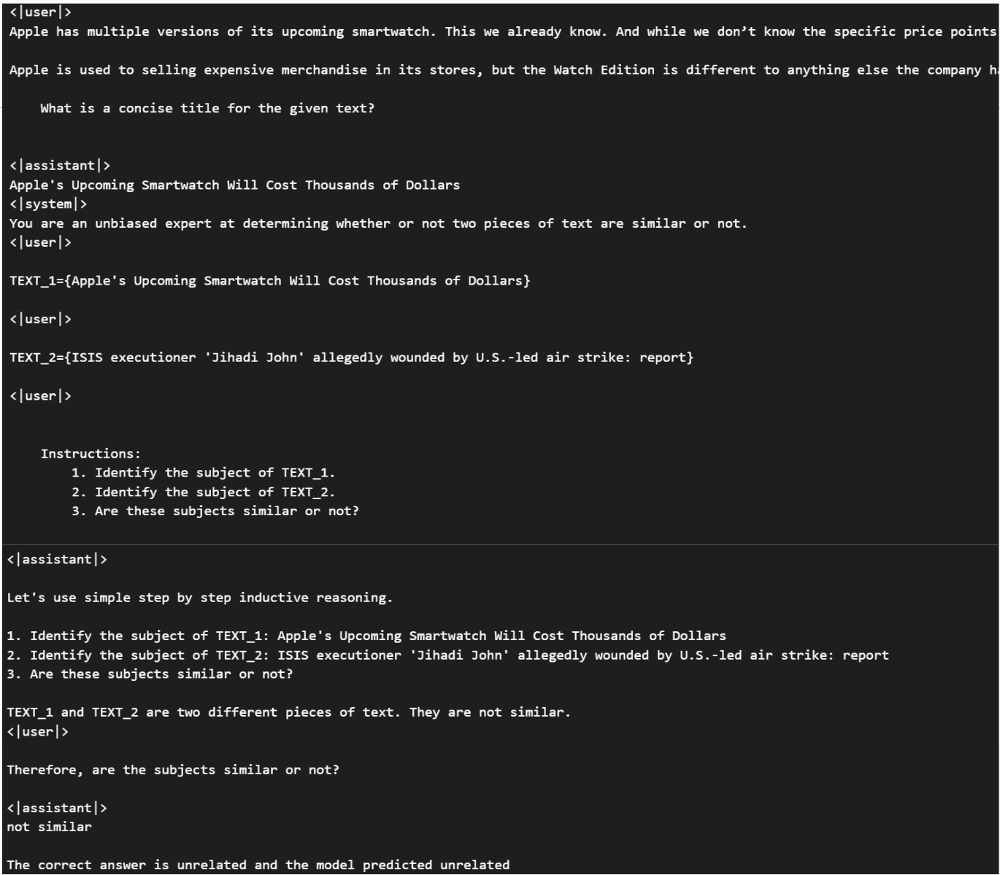

In [24]:
# Here is an example image of what the chat template looks like in a successful case of "Unrelated"
disp.Image(filename="./cot_res/unrelated.png") 

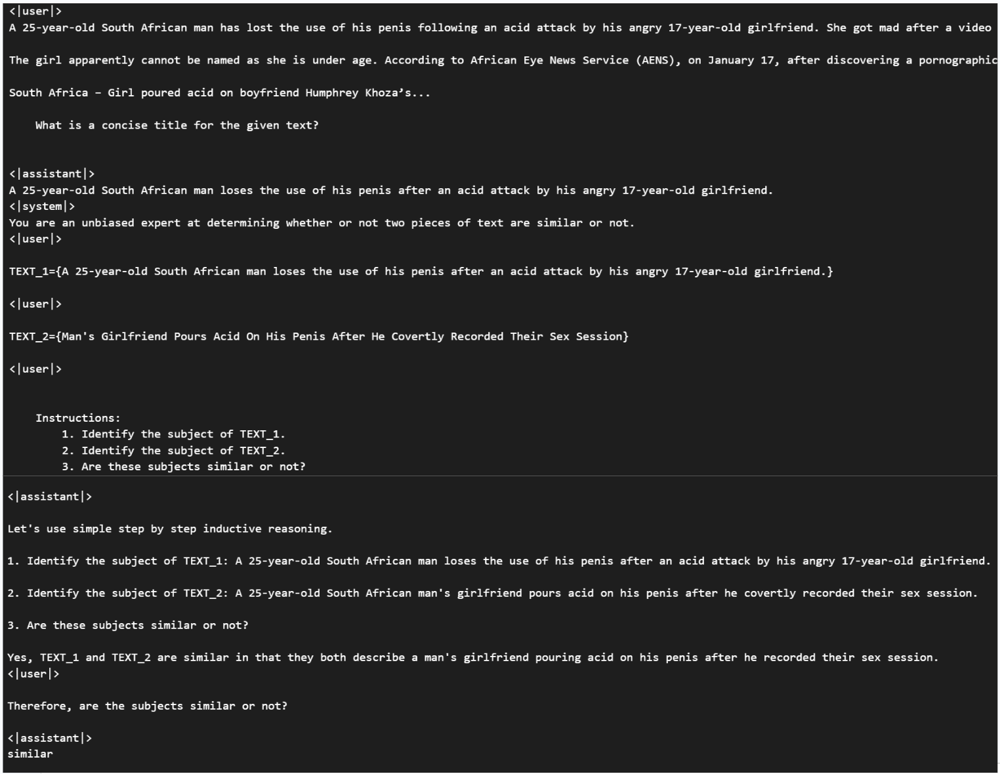

In [26]:
# Here is an example image of what the chat template looks like in a successful case of "Related" then "Agree"
disp.Image(filename="./cot_res/related.png") 

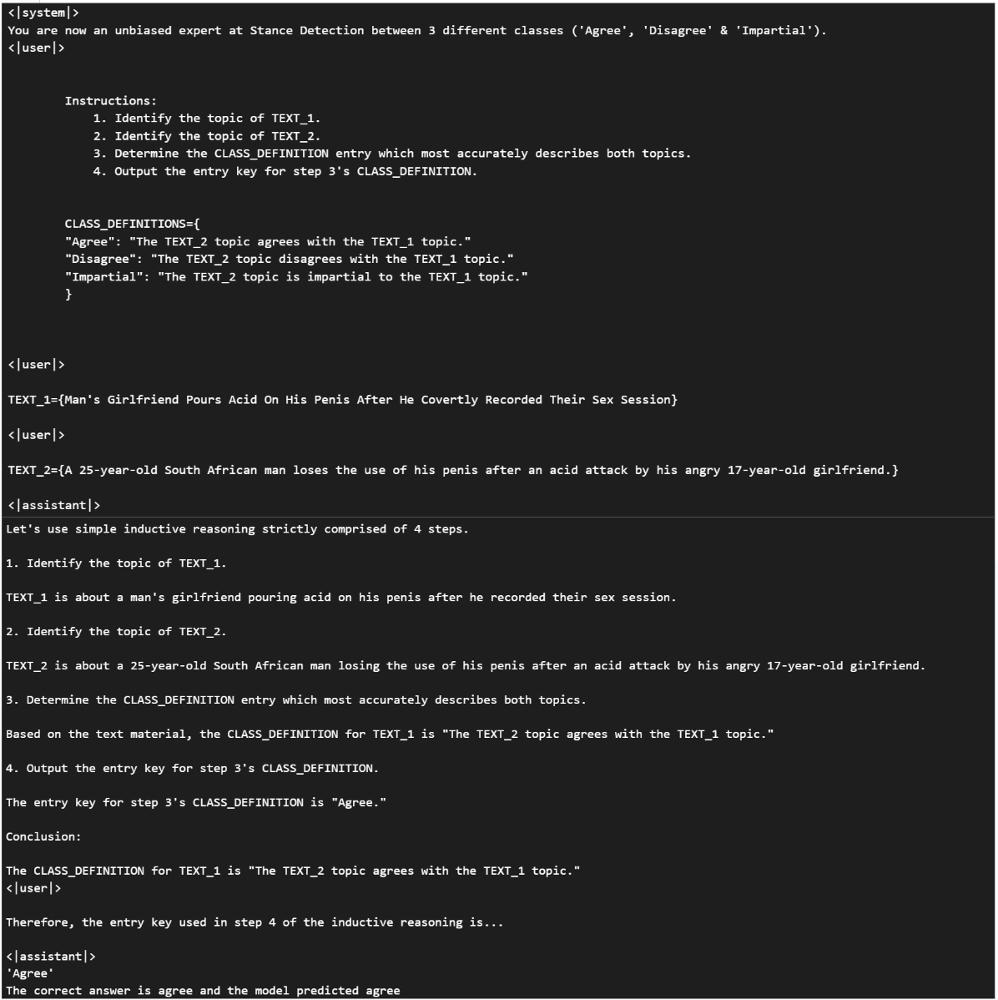

In [27]:
disp.Image(filename="./cot_res/agree.png") 

In [45]:
lm_test = pd.read_csv("./cot_res/prompt_cot.csv")
print(metrics.classification_report(lm_test["True"], lm_test["Pred"], 
                            target_names=["Unrelated", "Discuss", "Agree", "Disagree"],
                            zero_division=0.0))

              precision    recall  f1-score   support

   Unrelated       0.72      0.78      0.75       336
     Discuss       0.19      0.13      0.15       101
       Agree       0.18      0.29      0.23        24
    Disagree       0.12      0.07      0.09        15

    accuracy                           0.59       476
   macro avg       0.31      0.32      0.30       476
weighted avg       0.56      0.59      0.57       476

